# Plane Simple - Time Series and Text Sentiment Analysis

Report by:  <font color=blue> Leandro Marigo
    
Date: <font color=blue> May 2023

## About the dataset  

This dataset contains data on tweets related to various airlines.

## Atribute information:


**tweet_id:** Unique identifier for each tweet (data type: integer)  
**airline_sentiment:** Sentiment of the tweet towards the airline, can be one of three values: "positive", "neutral", or "negative" (data type: string)  
**airline_sentiment_confidence:** Confidence score of the sentiment label assigned to the tweet (data type: float)  
**negativereason:** Reason for negative sentiment, if applicable, otherwise null (data type: string)  
**negativereason_confidence:** Confidence score of the negative reason label assigned to the tweet (data type: float)     
**airline:** Airline associated with the tweet (data type: string)    
**airline_sentiment_gold:** If the tweet sentiment was determined by a human annotator, this field contains the sentiment label assigned by the annotator (data type: string)  
**name:** Twitter username of the person who posted the tweet (data type: string)   
**negativereason_gold:** If the negative reason was determined by a human annotator, this field contains the negative reason assigned by the annotator (data type: string)  
**retweet_count:** Number of times the tweet has been retweeted (data type: integer)  
**text:** Text content of the tweet (data type: string)  
**tweet_coord:** Geographic coordinates of the tweet location, if available, otherwise null (data type: string)  
**tweet_created:** Date and time the tweet was created (data type: string)  
**tweet_location:** Location specified in the tweet profile, if available, otherwise null (data type: string)  
**user_timezone:** Time zone of the person who posted the tweet (data type: string)   

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      Introduction
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

A new airline company, PlaneSimple, is looking to see if it can benefit from machine learning, and has tasked me with performing several analyses.

**Part 1: Time Series - Forecasting Airline Interest**  
PlaneSimple is looking to model the frequency at which people Tweet about flying. They would like to model the number of tweets as a time series, and make forecasts into the future.  

a.	Briefly explain why Time Series may be useful in this situation and describe the analysis objective.  
b.	Train an appropriate Time Series model on this data. Include justification for any hyper parameters chosen, and how validation was performed (eg train-test split).	 
c.	Use the model to make a forecast for one week into the future. Note if data was resampled, a different forecast period ma be applied, where appropriate.  
d.	Explain the results and conclusions, as well as discuss any limitations to the analysis.  


**Part 2: Text Analysis - Analysing the Tweet Content**  
PlaneSimple is interested not just in how many tweets there are, but what people are talking about.  

a.	Briefly explain why Text Analysis may be useful in this situation and describe the analysis objective.  
b.	Train an appropriate model to perform Sentiment Analysis on the tweets.  
c.	Train an appropriate model to perform Topic Modelling on the tweets.  
d.	Explain the results and conclusions, as well as discuss any limitations to the analysis.  


**Part 3: Challenge**  

Combine both models:  

a.	Train an appropriate time series model to forecast positive tweet sentiment.  
b.	Train an appropriate time series model to forecast an appropriate topic related to the subject.  
c.	Explain the results and conclusions, as well as discuss any limitations to my analysis.  

### The report is structured in different sections as outlined below:

   <font color=blue>**1. Exploratory Data Analysis**  
    
   <font color=blue>**2. Part 1: Time Series - Forecasting Airline Interest**  
       
        2.1. Data Preparation for Time Series Analysis  
        2.2  Modelling  
        2.3  Searching for Hyperparameters  
        2.4  Train / Test split  
        2.5  ARIMA Model  
        2.6  ARIMA Model Evaluation  
        2.7  Forecast using ARIMA  
        2.8  SARIMA Hyperparameters  
        2.9  SARIMA Model  
        2.9.1  SARIMA Model Evaluation  
        2.9.2 Forecast using SARIMA  
        2.9.3  Results, Conclusions and Limitations    
    
   <font color=blue>**3. Part 2: Text Analysis - Analysing the Tweet Content**  
       
        3.1. EDA and Data Prep. for Text Analysis  
        3.2  Text Preprocessing - Sentiment Analysis  
        3.3  Feature Selection  
        3.4  Sentiment Analysis ML Models  
        3.5  Text Preprocessing - Topic Modelling  
        3.6  LDA Results Visualization  
        3.7  Optimizing LDA Model  
        3.8  Results, Conclusions and Limitations     
    
   <font color=blue>**4. Part 3: Combine both models (Time-Series and Text Analysis)**  
       
        4.1 Exploration  
        4.2 Positive tweets prediction into the future - ARIMA Model  
        4.3 Topic 2 prediction into the future - ARIMA Model  
        4.4 Results, Conclusions and Limitations  
       
   <font color=blue>**5. Bibliography**    
       

In [1]:
from IPython.display import HTML
HTML('''<script>
code_show=true;
function code_toggle() {
if (code_show){
$('div.input').hide();
}else{
$('div.input').show();
}
code_show = !code_show
}
$(document).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      1. Exploratory Data Analysis
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns 
%matplotlib inline
import warnings
warnings.filterwarnings('ignore') 

C:\Users\leand\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\leand\anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\leand\anaconda3\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"


Importing the dataset

In [3]:
df = pd.read_csv("Tweets.csv")

Displaying the first 5 rows of the dataset

In [4]:
df.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
0,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
1,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
2,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
3,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
4,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)


The dataset has 14,640 rows and 15 columns

In [5]:
df.shape

(14640, 15)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14640 entries, 0 to 14639
Data columns (total 15 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   tweet_id                      14640 non-null  int64  
 1   airline_sentiment             14640 non-null  object 
 2   airline_sentiment_confidence  14640 non-null  float64
 3   negativereason                9178 non-null   object 
 4   negativereason_confidence     10522 non-null  float64
 5   airline                       14640 non-null  object 
 6   airline_sentiment_gold        40 non-null     object 
 7   name                          14640 non-null  object 
 8   negativereason_gold           32 non-null     object 
 9   retweet_count                 14640 non-null  int64  
 10  text                          14640 non-null  object 
 11  tweet_coord                   1019 non-null   object 
 12  tweet_created                 14640 non-null  object 
 13  t

In [7]:
df.describe()

,tweet_id,airline_sentiment_confidence,negativereason_confidence,retweet_count
count,1.464000e+04,14640.000000,10522.000000,14640.000000
mean,5.692184e+17,0.900169,0.638298,0.082650
std,7.791112e+14,0.162830,0.330440,0.745778
min,5.675883e+17,0.335000,0.000000,0.000000
25%,5.685592e+17,0.692300,0.360600,0.000000
50%,5.694779e+17,1.000000,0.670600,0.000000
75%,5.698905e+17,1.000000,1.000000,0.000000
max,5.703106e+17,1.000000,1.000000,44.000000


In [8]:
df.describe(include=object)

,airline_sentiment,negativereason,airline,airline_sentiment_gold,name,negativereason_gold,text,tweet_coord,tweet_created,tweet_location,user_timezone
count,14640,9178,14640,40,14640,32,14640,1019,14640,9907,9820
unique,3,10,6,3,7701,13,14427,832,14247,3081,85
top,negative,Customer Service Issue,United,negative,JetBlueNews,Customer Service Issue,@united thanks,"[0.0, 0.0]",2015-02-24 09:54:34 -0800,"Boston, MA",Eastern Time (US & Canada)
freq,9178,2910,3822,32,63,12,6,164,5,157,3744


**Checking for missing values**

There are missing values across different variables that will be handled at a later stage.

In [9]:
df.isnull().sum()

tweet_id                            0
airline_sentiment                   0
airline_sentiment_confidence        0
negativereason                   5462
negativereason_confidence        4118
airline                             0
airline_sentiment_gold          14600
name                                0
negativereason_gold             14608
retweet_count                       0
text                                0
tweet_coord                     13621
tweet_created                       0
tweet_location                   4733
user_timezone                    4820
dtype: int64

**Checking for duplicated values**

There are 36 duplicated rows in the dataset that must be deleted

In [10]:
df.duplicated().sum()

36

In [11]:
#pip install --upgrade pandas

In [12]:
#pip install --upgrade dataprep

In [13]:
#pip install dataprep

**Plotting the dataprep EDA for visualization and features stats insights.**

  0%|          | 0/529 [00:00<?, ?it/s]


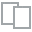
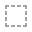
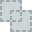
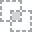
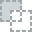
...
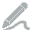
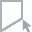
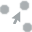
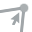
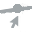

In [14]:
from dataprep.eda import plot, plot_correlation, create_report, plot_missing
plot(df)

## Observations from Dataprep.EDA

### Data insights

- Airline Sentiment is majoritarially negative;  
- Main reasons for negative sentiment are --> Customer Service and Late Flight;  
- Most tweetd airline is United followed by US Airways;  
- The variable 'tweet_created' is a string and needs to be converted to datetime type;  

### Missing values

- Total Missing Cells: 61962  
- Total Missing Cells (%): 28.2%  

<u> **Variables with most missing values** </u>
- airline_sentiment_gold has 14600 (99.73%) missing values 	
- negativereason_gold has 14608 (99.78%) missing values 	
- tweet_coord has 13621 (93.04%) missing values  


<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      2. Part 1: Time Series - Forecasting Airline Interest
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

The objective of the analysis is to develop a time series model that accurately predicts the frequency of tweets about airline companies, and use this model to make forecasts into the future.

Time Series analysis is useful in this situation because it helps to model the patterns and trends in the data over time, allowing us to make forecasts into the future. By modeling the frequency at which people tweet about flying and airline companies, PlaneSimple can gain insights into trends in airline interest and potentially use this information to make better and informed business decisions around marketing, sales, and customer service.

### 2.1 Data Preparation for Time Series Analysis

Convert the variable "tweet_created" from string to datetime type

In [15]:
df['tweet_created'] = pd.to_datetime(df['tweet_created'])

Creating a line plot of the time series

Setting the 'tweet_created' column as the DataFrame index

In [16]:
df = df.set_index('tweet_created')
df = df.sort_index()

In [17]:
# Resampling data at hourly frequency and count the number of tweets
hourly_count = df.resample('H').size()

In [18]:
# Fill any missing values with zero
hourly_count.fillna(0, inplace=True)

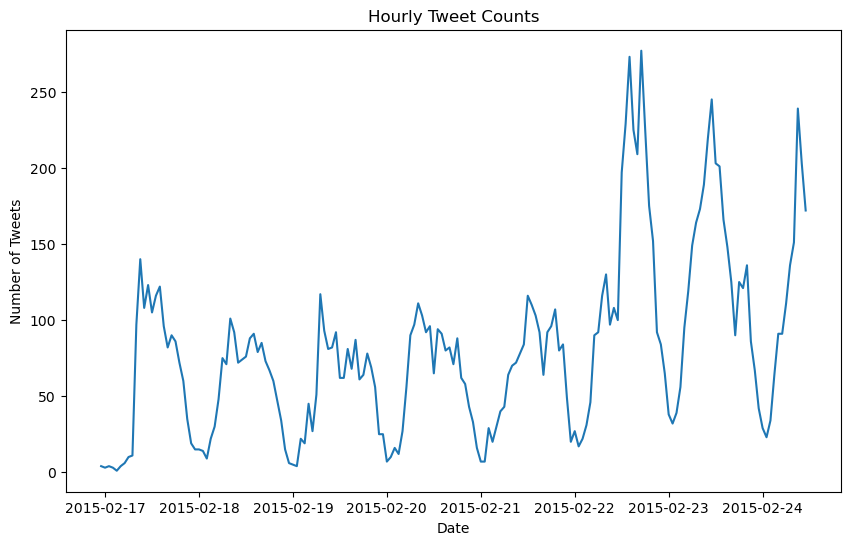

In [19]:
# plot the count of tweets over time
plt.figure(figsize=(10, 6))
plt.plot(hourly_count.index, hourly_count.values)
plt.xlabel('Date')
plt.ylabel('Number of Tweets')
plt.title('Hourly Tweet Counts')
plt.show()

In [20]:
# Add the hourly_count Series as a new column in the df DataFrame
df = df.assign(hourly_count=hourly_count)

### 2.2 Modelling

It is important to decompose the time series into it's four components, Level, Trend, Seasonality and Noise in order to observe the change in the patterns of the time series.

   - **Level:** It is the main value that goes on average with time.  
   - **Trend:** The trend is the value that causes increasing or decreasing patterns in a time series.  
   - **Seasonality:** This is a cyclic event that occurs in time series for a short time and causes the increasing or decreasing patterns for a short time in a time series.  
   - **Noise:** These are the random variations in the time series.  
   
There are two types of components, additive and multiplicative. It's observed from the chart above that the time series can be treated as additive. "By visualization, we can say the time series is additive if the increasing or decreasing pattern of the time series is similar throughout the series." (Verma , 2021)

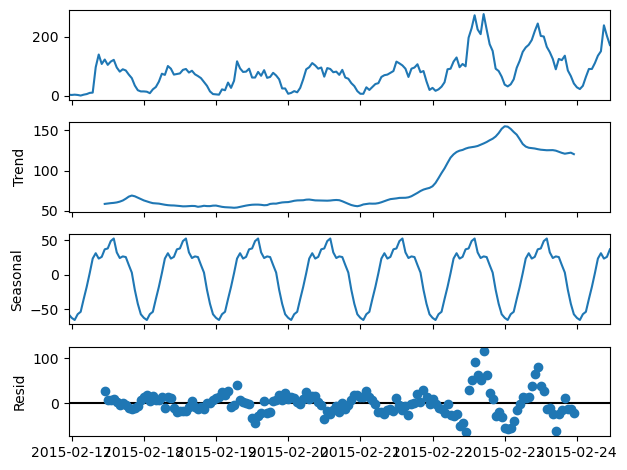

In [21]:
from statsmodels.tsa.seasonal import seasonal_decompose

# Fill any missing values with zero
hourly_count.fillna(0, inplace=True)

# Perform seasonal decomposition using period = 24 hours
result = seasonal_decompose(hourly_count, model='additive', period=24)

# Plot the decomposition results
result.plot()
plt.show()

**Visuzalizing the observed values.**

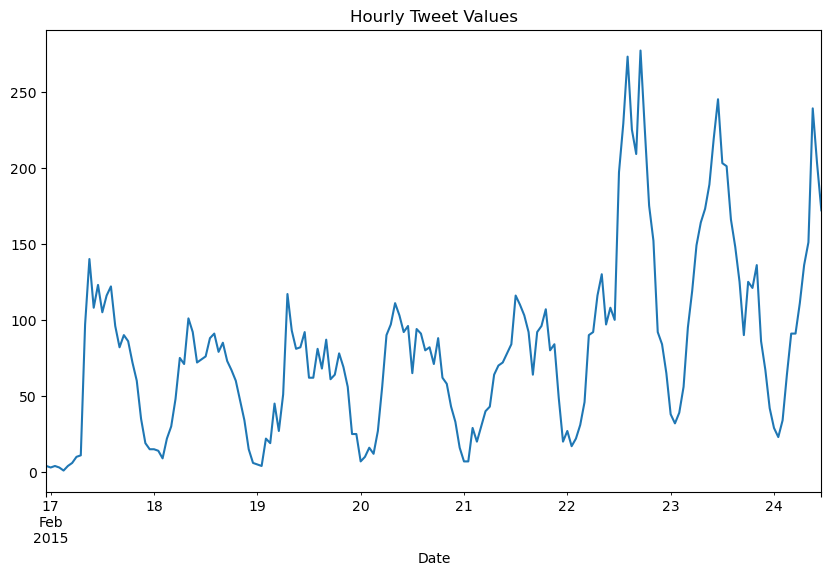

In [22]:
plt.figure(figsize=(10, 6))
level = result.observed
level.plot()
plt.title('Hourly Tweet Values')
plt.xlabel('Date')
plt.show()

**Visuzalizing the trend**

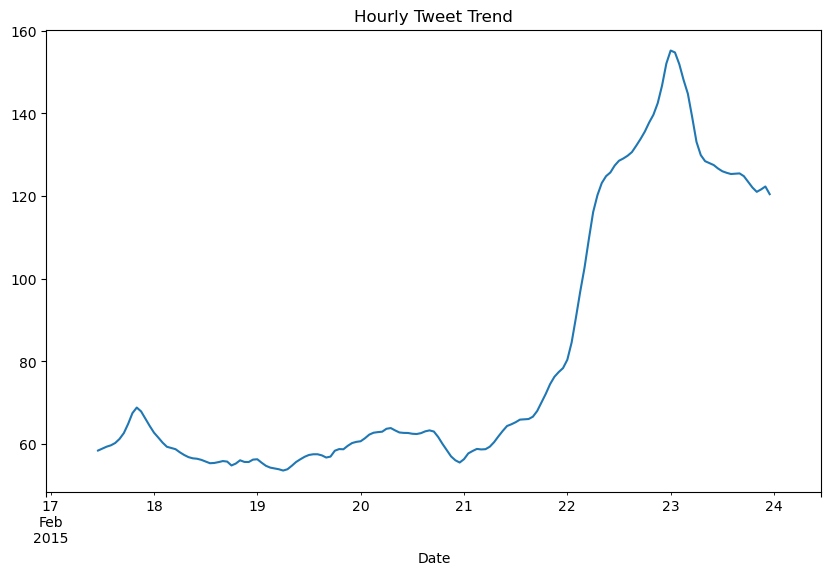

In [23]:
plt.figure(figsize=(10, 6))
trend = result.trend
trend.plot()
plt.title('Hourly Tweet Trend')
plt.xlabel('Date')
plt.show()

**Visuzalizing the seasonality**

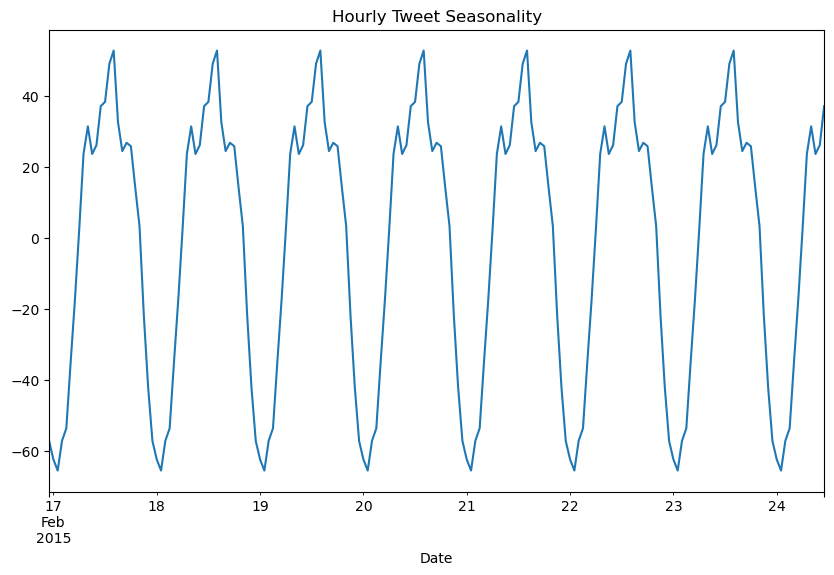

In [24]:
plt.figure(figsize=(10, 6))
seasonality = result.seasonal
seasonality.plot()
plt.title('Hourly Tweet Seasonality')
plt.xlabel('Date')
plt.show()

**Visuzalizing the residual**

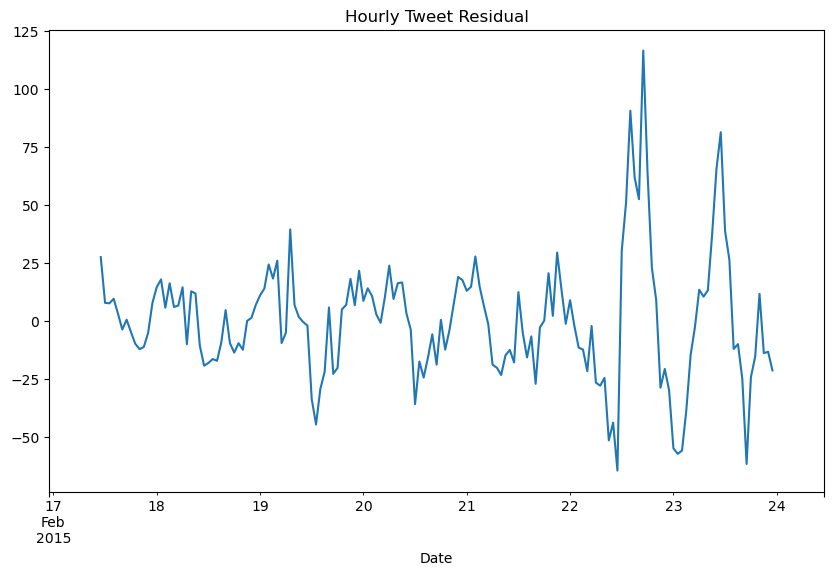

In [25]:
plt.figure(figsize=(10, 6))
residual = result.resid
residual.plot()
plt.title('Hourly Tweet Residual')
plt.xlabel('Date')
plt.show()

**The Augmented Dickey-Fuller test (ADF test)**

I will use the Augmented Dickey-Fuller method (ADF test) to test if the time series is stationary or not.  

According to the research (Verma, 2021). "ADF (Augmented Dickey-Fuller) test is a statistical significance test which means the test will give results in hypothesis tests with null and alternative hypotheses. As a result, we will have a p-value from which we will need to make inferences about the time series, whether it is stationary or not."

In [26]:
from statsmodels.tsa.stattools import adfuller

# Perform ADF test on hourly_count
result = adfuller(hourly_count)

# Print the test statistic, p-value, and other test results
print('ADF Statistic:', result[0])
print('p-value:', result[1])
print('Critical Values:')
for key, value in result[4].items():
    print('\t%s: %.3f' % (key, value))

ADF Statistic: -4.9830817786186135
p-value: 2.3969325318762397e-05
Critical Values:
	1%: -3.468
	5%: -2.878
	10%: -2.576


p-value is higher than significance level of 0.05, therefore the time series is considered non-stationary.  

For non stationary I will use the ARIMA algorithm to build the machine learning model.

**Checking differencing for stationarity**

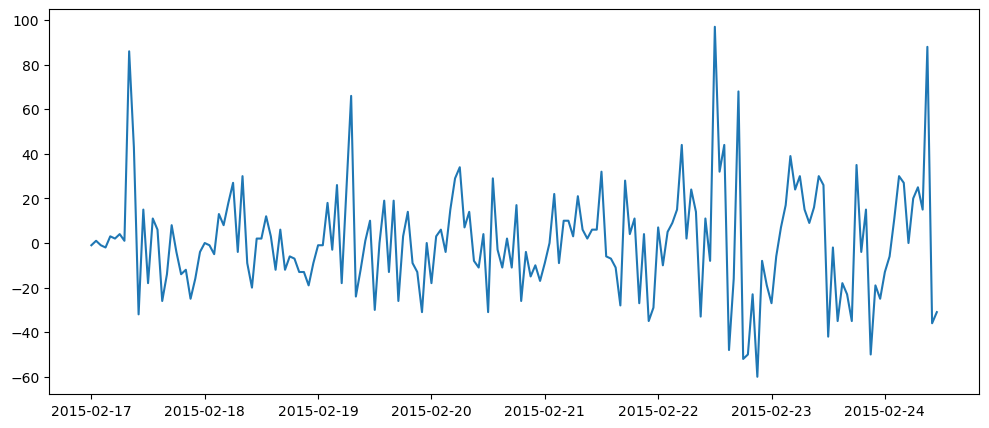

In [27]:
plt.figure(figsize = [12, 5])
plt.plot(hourly_count.diff(1).dropna());

### 2.3 Searching for Hyperparameters

I will visualize the Autocorrelation and Partial Autocorrelation and also apply the Akaike Information Criterion (AIC) in order to evaluate the model performance and grid search for best hyperparameter for p, d and q.  

The parameters of the ARIMA model are defined as follows:  

   - p: The number of lag observations included in the model, also called the lag order.  
   - d: The number of times that the raw observations are differenced, also called the degree of differencing.  
   - q: The size of the moving average window, also called the order of moving average.  

In [28]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

The autocorrelation function (ACF) defines how data points in a time series are related, on average, to the preceding data points (Box, Jenkins, & Reinsel, 1994). In other words, it measures the self-similarity of the signal over different delay times.

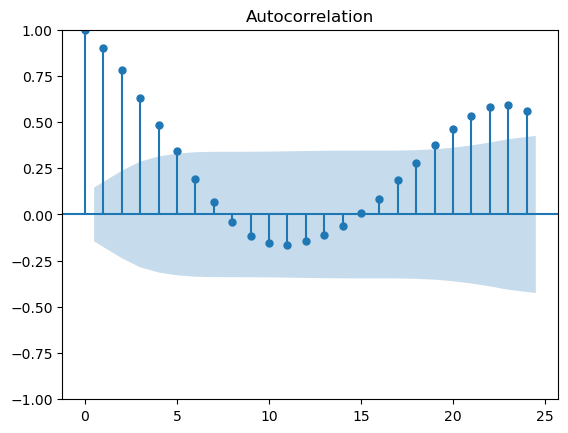

In [29]:
plot_acf(hourly_count, lags=24);

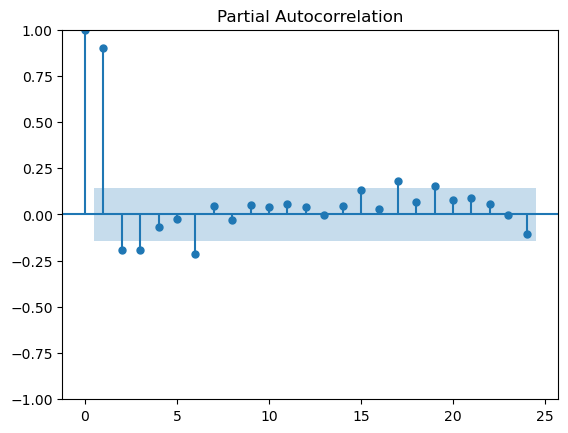

In [30]:
plot_pacf(hourly_count, lags=24);

**Visualizing stationary acf and pacf**

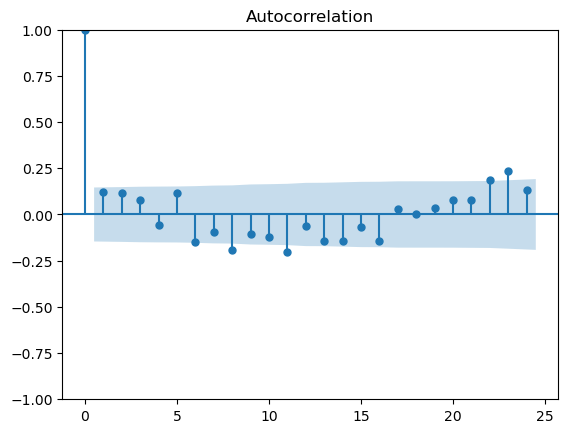

In [31]:
diff = hourly_count.diff(1)
plot_acf(diff.dropna(), lags = 24);

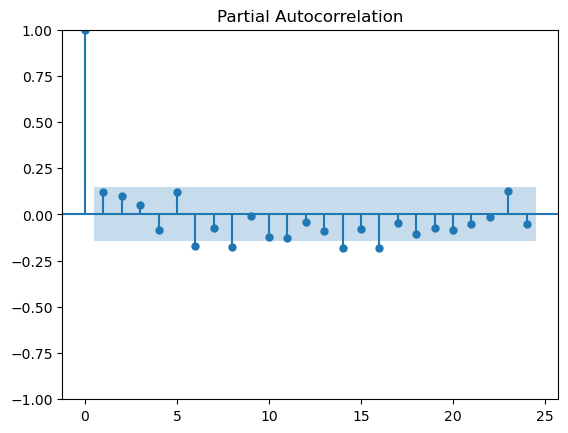

In [32]:
plot_pacf(diff.dropna(), lags = 24);

It's observed from the ACF chart that q for MA should be 1 and from PACF chart that p for AR should also be the lag 1 near 0.9 which are the most significant correlation points.

**Akaike information criterion**

In [33]:
import statsmodels.tsa.api as sm

aicVals = []
for p in range(0, 6):
    for d in range(0, 6):
         for q in range(0, 6):
                aicVals.append([sm.ARIMA(hourly_count, order=(p, d, q)).fit().aic, p, d, q])

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

In [34]:
aicVals.sort()

In [35]:
aicVals

[[20.0, 4, 5, 5],
 [934.6462861474552, 1, 4, 4],
 [1623.7313517202524, 4, 1, 3],
 [1625.7789833436095, 2, 1, 2],
 [1643.2510968276952, 4, 1, 2],
 [1647.796106512014, 2, 1, 4],
 [1649.3543474652254, 3, 1, 4],
 [1651.017119352366, 2, 1, 5],
 [1651.6999001254378, 1, 0, 5],
 [1652.1393746016206, 3, 2, 2],
 [1652.4036748999015, 3, 0, 5],
 [1652.7282305358212, 1, 2, 4],
 [1652.8044104571418, 4, 0, 1],
 [1653.171579602838, 2, 0, 5],
 [1653.1997983213412, 2, 2, 4],
 [1653.2223175050367, 4, 0, 2],
 [1653.4897690675048, 3, 2, 3],
 [1653.5079530785965, 4, 2, 2],
 [1653.8429508251884, 1, 2, 5],
 [1653.864008591338, 3, 1, 1],
 [1653.8906772643304, 3, 0, 3],
 [1654.0346305828214, 0, 1, 5],
 [1654.056966955383, 4, 0, 3],
 [1654.0582992273394, 5, 0, 4],
 [1654.2520769892128, 3, 2, 4],
 [1654.3178195655578, 4, 0, 5],
 [1654.3672788580634, 1, 1, 3],
 [1654.4383365561994, 5, 0, 5],
 [1654.6633153193618, 5, 0, 1],
 [1654.680795505224, 5, 0, 2],
 [1654.7631016446808, 2, 1, 3],
 [1655.1234331005198, 4, 1, 1

After trying a few of the lowest parameters in the list the best performing is:  

   - p = 4  
   - d = 1  
   - q = 3  
   
Which performed very similarly to 2,1,2 but with a lower mean squared error.

### 2.4 Train / Test split

In [36]:
len(hourly_count.values)

181

Split 80% / 20%

In [37]:
train = hourly_count[:145]
test = hourly_count[145:]

### 2.5 ARIMA Model

According to Auhl (2021). "The ARIMA model (an acronym for Auto-Regressive Integrated Moving Average), essentially creates a linear equation which describes and forecasts your time series data. This equation is generated through three separate parts which can be described as:

   - AR — auto-regression: equation terms created based on past data points
   - I — integration or differencing: accounting for overall “trend” in the data
   - MA — moving average: equation terms of error or noise based on past data points

Together, these three parts make up the AR-I-MA model."

In [38]:
from statsmodels.tsa.arima.model import ARIMA

In [39]:
model = ARIMA(train, order=(4,1,3)).fit()

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [40]:
len(train)

145

In [41]:
pred = model.predict(start=len(train), end=len(hourly_count)-1)

In [42]:
pred

2015-02-23 00:00:00-08:00     46.474150
2015-02-23 01:00:00-08:00     55.442375
2015-02-23 02:00:00-08:00     53.100082
2015-02-23 03:00:00-08:00     73.245692
2015-02-23 04:00:00-08:00     87.325589
2015-02-23 05:00:00-08:00    115.373851
2015-02-23 06:00:00-08:00    139.081782
2015-02-23 07:00:00-08:00    169.334389
2015-02-23 08:00:00-08:00    194.348287
2015-02-23 09:00:00-08:00    219.857864
2015-02-23 10:00:00-08:00    238.403482
2015-02-23 11:00:00-08:00    253.181577
2015-02-23 12:00:00-08:00    259.853173
2015-02-23 13:00:00-08:00    260.668272
2015-02-23 14:00:00-08:00    253.656822
2015-02-23 15:00:00-08:00    240.953852
2015-02-23 16:00:00-08:00    222.335638
2015-02-23 17:00:00-08:00    200.085945
2015-02-23 18:00:00-08:00    175.093993
2015-02-23 19:00:00-08:00    149.667525
2015-02-23 20:00:00-08:00    125.155395
2015-02-23 21:00:00-08:00    103.559678
2015-02-23 22:00:00-08:00     86.085609
2015-02-23 23:00:00-08:00     74.072141
2015-02-24 00:00:00-08:00     68.125715


### 2.6 ARIMA Model Evaluation

In [43]:
from sklearn.metrics import mean_squared_error

In [44]:
error = np.sqrt(mean_squared_error(test,pred))
error

44.47491083153156

In [45]:
test.mean(), np.sqrt(test.var())

(121.44444444444444, 64.14512316144405)

<AxesSubplot:xlabel='tweet_created'>

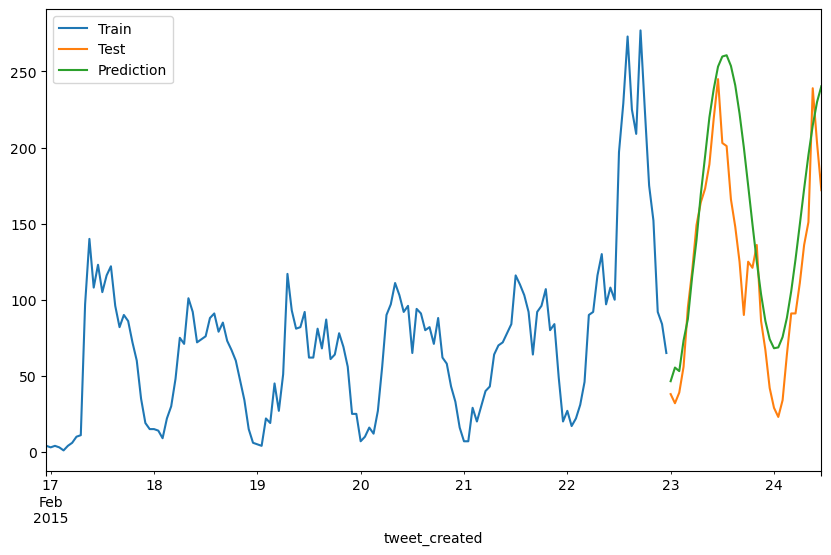

In [46]:
train.plot(legend=True, label='Train', figsize=(10,6))
test.plot(legend=True, label='Test')
pred.plot(legend=True, label='Prediction')

It's observed in the chart that the model seems to be performing well.

### 2.7 Forecast using ARIMA

As I resampled the data to capture hours instead of days, I will predict the number of tweets for the next 72 hours (3 days) and 168 hours (7 days).

In [47]:
final_model = ARIMA(hourly_count, order=(4,1,3)).fit()

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [48]:
prediction = final_model.predict(len(hourly_count),len(hourly_count)+72)

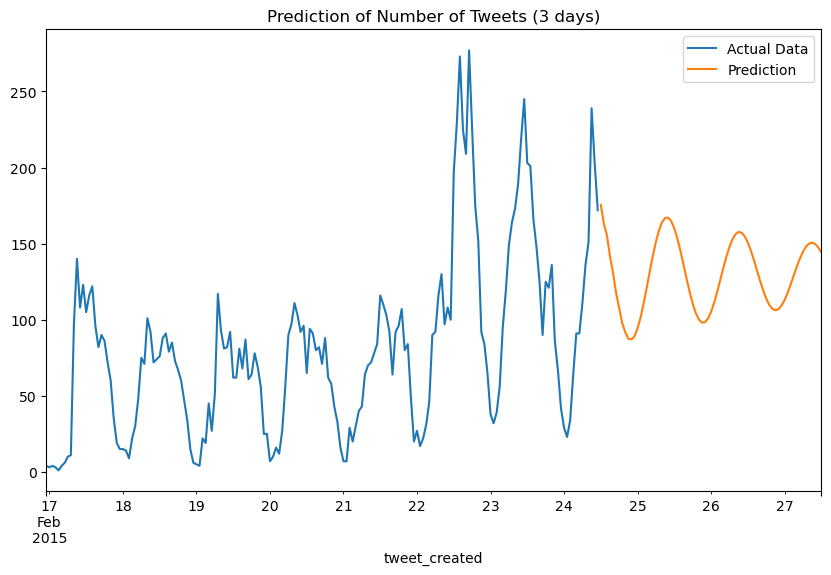

In [49]:
hourly_count.plot(legend=True, label='Actual Data', figsize=(10,6))
prediction.plot(legend=True, label='Prediction')
plt.title('Prediction of Number of Tweets (3 days)');

In [50]:
prediction2 = final_model.predict(len(hourly_count),len(hourly_count)+168)

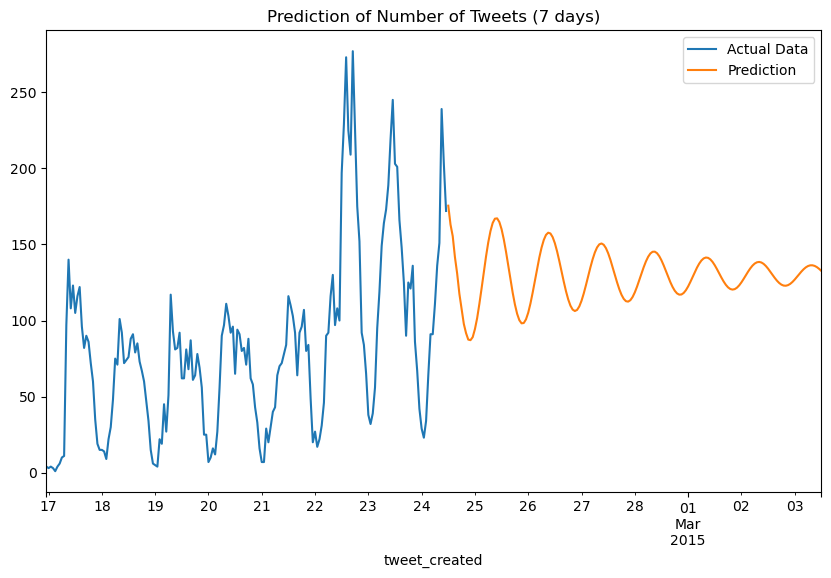

In [51]:
hourly_count.plot(legend=True, label='Actual Data', figsize=(10,6))
prediction2.plot(legend=True, label='Prediction')
plt.title('Prediction of Number of Tweets (7 days)');

The ARIMA model seems to be performing better when predicting on a shorter period (3 vs 7 days) and it might have happend because of the seasonality component. I will also employ the SARIMA model that takes into account the Sesoanlity factor and I will compare the results.

Before employing the SARIMA model I will remove the upwards trend in the end of the week which can mislead predictions.

### 2.8 SARIMA Hyperparameters

The SARIMA model adds the S to the ARIMA model which stands for Seasonality and therefore can be much more powerful than the ARIMA model when it comes to predicting seasonal values.

In [52]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

**Akaike information criterion**

Using the stationary data to search for hyperparameters as this yeild best results for SARIMA as observed after test and trial.

<font color=red>**BE CAREFUL THIS IS TAKING A LONG TIME TO RUN**

In [ ]:
aicVals = []
for p in range(0, 3):
    for d in range(0, 3):
        for q in range(3):
            for P in range(3):
                for D in range(3):
                    for Q in range(3):
                        #SARIMA(p, d, q, P, D, Q).aic
                        aicVals.append([SARIMAX(diff, order=(p, d, q), seasonal_order=(P, D, Q, 24)).fit().aic,p,d, q, P, D, Q, 24])

In [ ]:
aicVals.sort()

In [ ]:
aicVals

The hyperparameters with score 1340.84176... is the one performing best results.

   - p = 2  
   - d = 0  
   - q = 2
   - P = 0
   - D = 2
   - Q = 2

### 2.9 SARIMA Model

In [53]:
arima_order = (2,0,2)
sarima_order = (0,2,2,24)

# define model
sarima_model = SARIMAX(train, order=arima_order, seasonal_order=sarima_order).fit()

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [54]:
sarima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  145
Model:             SARIMAX(2, 0, 2)x(0, 2, 2, 24)   Log Likelihood                -465.811
Date:                            Sun, 28 May 2023   AIC                            945.623
Time:                                    16:24:30   BIC                            963.645
Sample:                                02-16-2015   HQIC                           952.910
                                     - 02-22-2015                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0331      0.118     -0.279      0.780      -0.265       0.199
ar.L2          0.7471      0.101      7.420      0.000       0.550       0.944
ma.L1          0.8064      6.901      0.117      0.907     -12.719      14.332
ma.L2         -0.1932      1.328     -0.146      0.884      -2.796       2.410
ma.S.L24      -0.6855      0.140     -4.900      0.000      -0.960      -0.411
ma.S.L48       0.3090      0.212      1.458      0.145      -0.106       0.724
sigma2       735.7425   5062.785      0.145      0.884   -9187.134    1.07e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):                 2.73
Prob(Q):                              0.83   Prob(JB):                         0.26
Heteroskedasticity (H):               2.48   Skew:                             0.25
Prob(H) (two-sided):                  0.01   Kurtosis:                         3.65
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

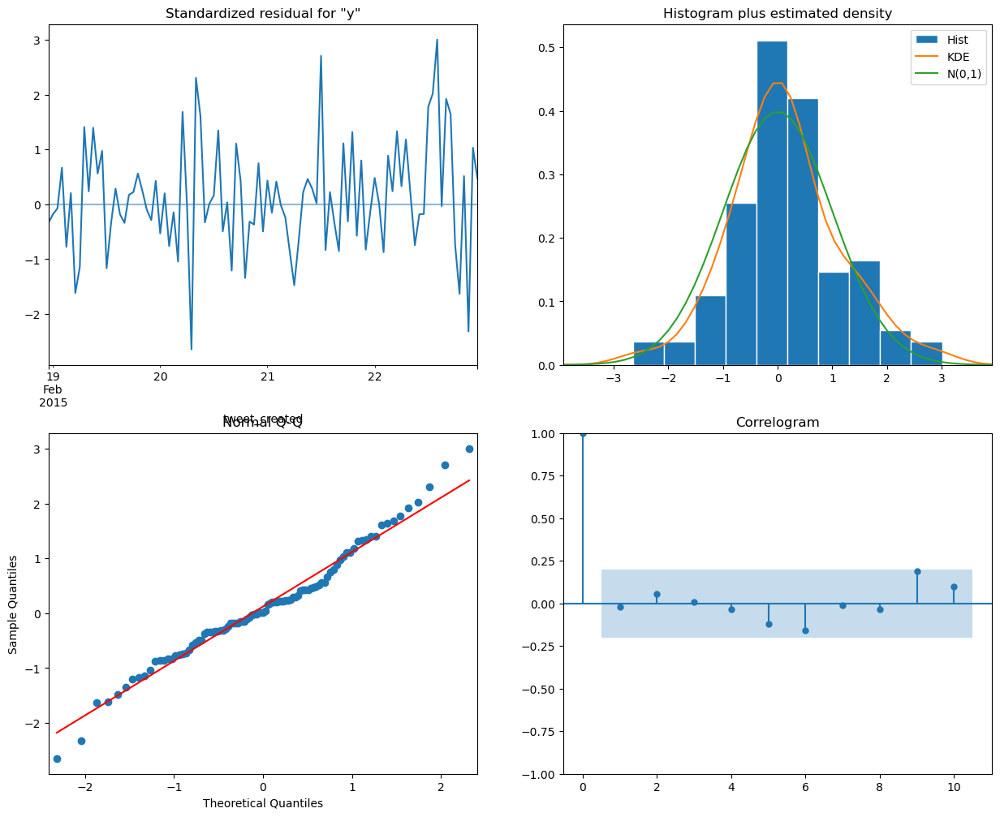

In [55]:
sarima_model.plot_diagnostics(figsize=(15, 12));

In [56]:
sarima_pred = sarima_model.predict(start=len(train), end=len(hourly_count)-1)

### 2.9.1 SARIMA Model Evaluation

In [57]:
sarima_error = np.sqrt(mean_squared_error(test,sarima_pred))
sarima_error

84.19146402759327

<AxesSubplot:xlabel='tweet_created'>

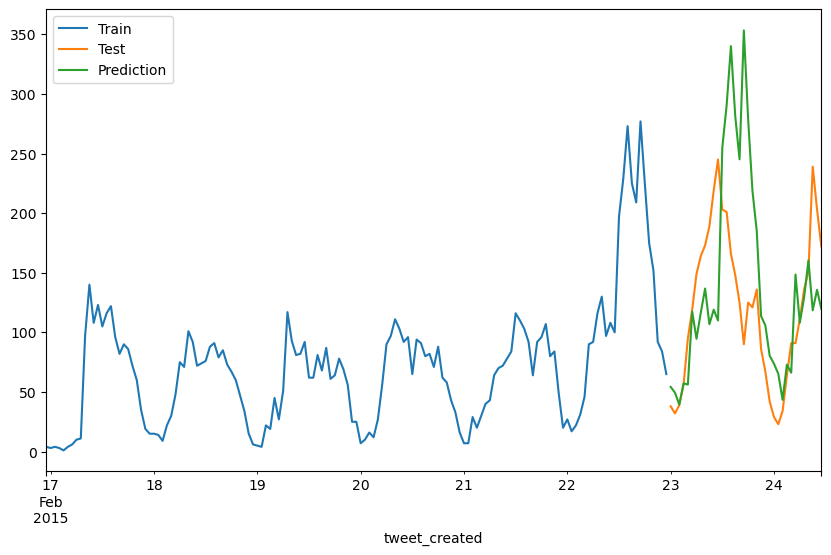

In [58]:
train.plot(legend=True, label='Train', figsize=(10,6))
test.plot(legend=True, label='Test')
sarima_pred.plot(legend=True, label='Prediction')

Observing the graph it seems that the SARIMA model is not performing well capturing an upward trend that is higher than real data points.

### 2.9.2 Forecast using SARIMA

In [59]:
sarima_prediction = sarima_model.predict(len(hourly_count),len(hourly_count)+72)

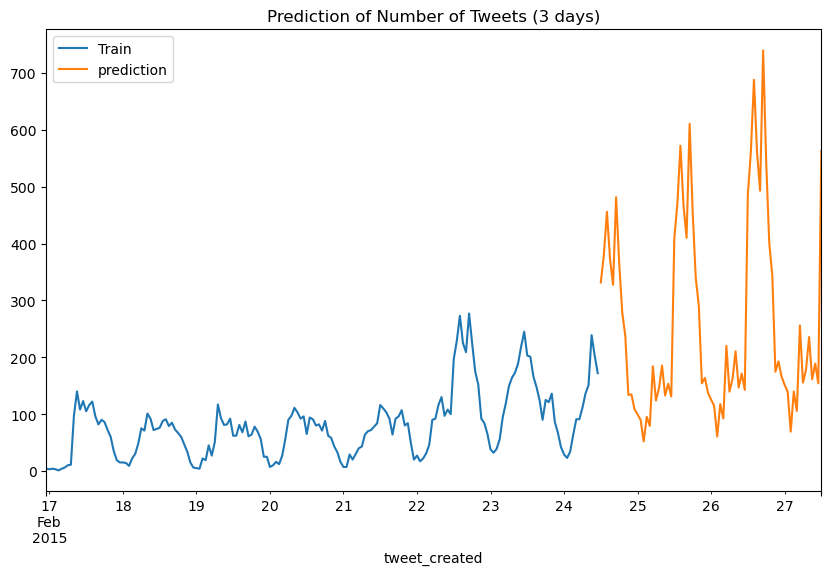

In [60]:
hourly_count.plot(legend=True, label='Train', figsize=(10,6))
sarima_prediction.plot(legend=True, label='prediction')
plt.title('Prediction of Number of Tweets (3 days)');

In [61]:
sarima_prediction2 = sarima_model.predict(len(hourly_count),len(hourly_count)+168)

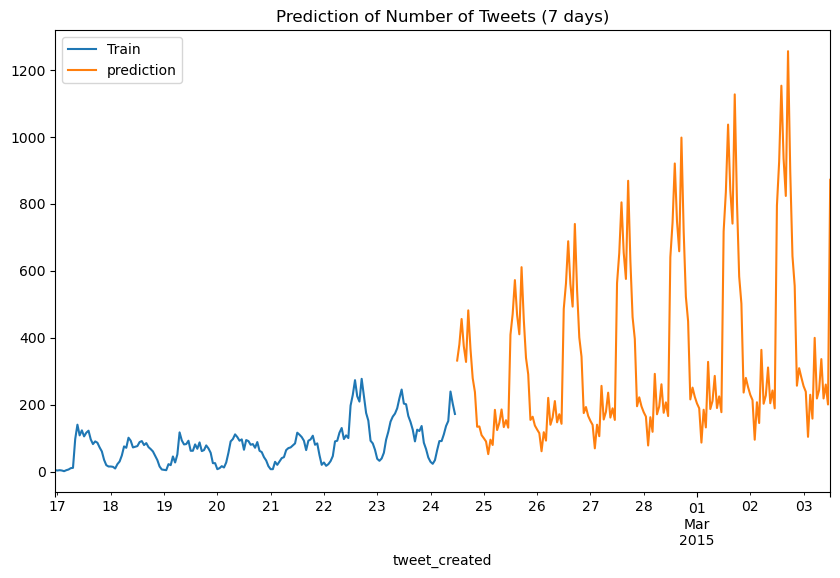

In [62]:
hourly_count.plot(legend=True, label='Train', figsize=(10,6))
sarima_prediction2.plot(legend=True, label='prediction')
plt.title('Prediction of Number of Tweets (7 days)');

Observing the graph apparently there is some trend being captured and I will try to remove this trend before employing SARIMA again.

**I explored different methods to remove the trend and tested different hyperparameters for SARIMA, the AIC model is taking more than 1 hour to run so I will keep the range between (0, 3), however there should be room for improvements if the range increases. I was not able to find a solution for removing the trend, the best results appeared when I searched for hyperparameters using the stationary data for the SARIMA model which seems has reduced the trend but not completely removed it. I will keep this on the radar as a next step to further optimize the model and improve predictions.**

### 2.9.3 Results, Conclusions and Limitations

Both models ARIMA and SARIMA will be considered and presented as two different scenarios, ARIMA is predicting values within a lower range and therefore will be called the conservative scenario and SARIMA is capturing an upward trend in its prediction which is hard to confirm with the limitations of the data sample (only one week of data). In order to confirm if there's an overall upward trend in the number of tweets per day, more data (time) would be needed. The recommendation is to keep tracking of the data for at least a whole month or quarter and keep working and optimizing both models to be able to predict more accruratly.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      3. Part 2: Text Analysis - Analysing the Tweet Content
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

The objective of text analysis is to gain deeper insights into the tweet content, understand customer sentiment, identify topics and themes, extract key information, identify emerging trends, and conduct comparative analysis. This information can assist PlaneSimple in understanding customer perceptions, improving their services, addressing customer concerns, and staying informed about the evolving landscape of customer discussions.

### 3.1 EDA and Data Prep. for Text Analysis

A supervised machine learning based approach will be employed using the pre-labeled variable "airline_sentiment".

Take a look more closely at the variable "airline_sentiment" which contains the classification for the sentiment of each tweet which are "Neutral", "Negative" or "Positive".

<AxesSubplot:xlabel='airline_sentiment', ylabel='count'>

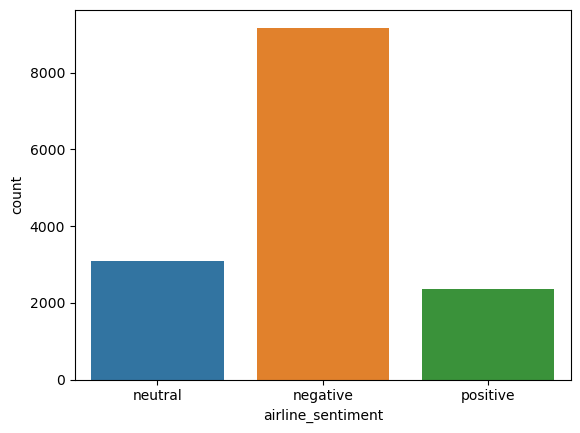

In [63]:
sns.countplot(x="airline_sentiment", data=df)

It's observed the variable is unbalanced containing more negative than the other two labels.

Take a look at the main reasons for the negative tweet.

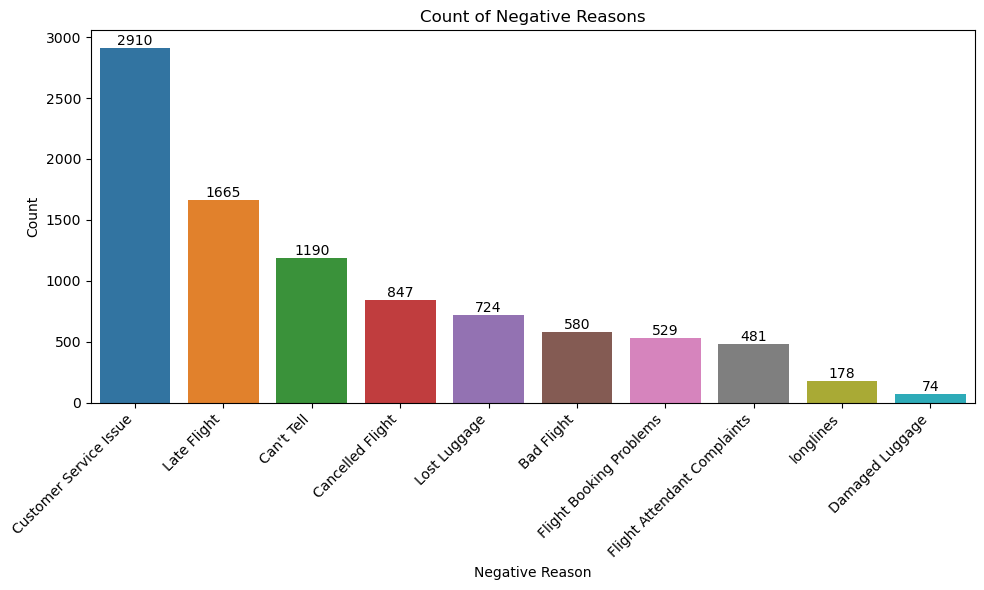

In [64]:
# Sort the negativereason variable by count in descending order
neg_reason_counts = df['negativereason'].value_counts().sort_values(ascending=False)

# Set the figure size
plt.figure(figsize=(10, 6))

# Create the countplot with sorted negativereason variable
ax = sns.countplot(x="negativereason", data=df, order=neg_reason_counts.index)

# Rotate x-axis labels for better readability
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')

# Set the title and labels
plt.title('Count of Negative Reasons')
plt.xlabel('Negative Reason')
plt.ylabel('Count')

# Add labels outside the chart
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center', xytext=(0, 5), textcoords='offset points')

# Adjust the layout to accommodate the labels outside the chart
plt.tight_layout()

# Show the plot
plt.show()

It's observed from the chart that the majority of the negative tweets are related to Customer Service issues and Late Flight.

**Removing duplicates**

In [65]:
text_df = df.drop_duplicates()

In [66]:
text_df.duplicated().sum()

0

**Heatmap and pairplot to identify feature correlation**

In [67]:
mask = np.zeros_like(text_df.corr())
triangle_indices = np.triu_indices_from(mask)
mask [triangle_indices] = True

<AxesSubplot:>

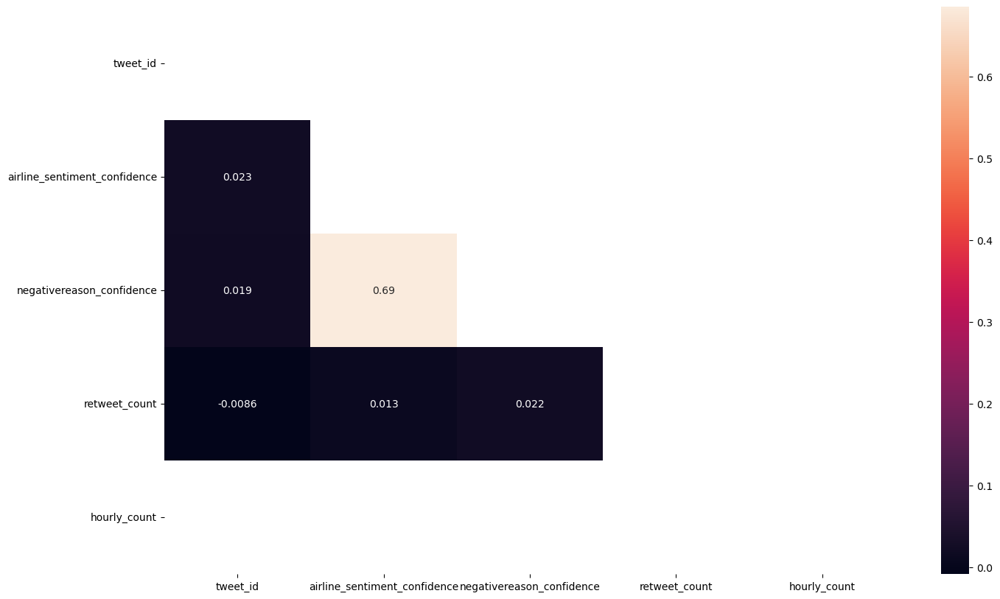

In [68]:
plt.figure(figsize=(16,10))
sns.heatmap(text_df.corr(), mask=mask, annot=True)

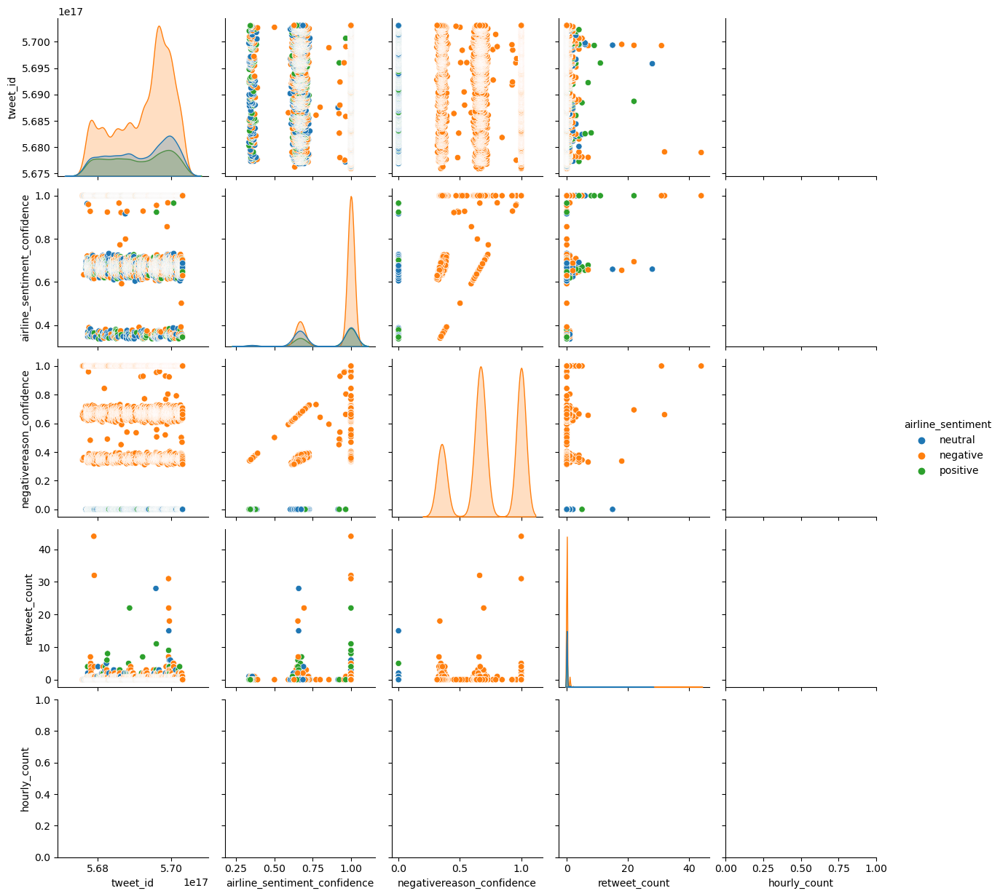

In [69]:
# Reset the index of the DataFrame
text_df = text_df.reset_index(drop=True)

# Plot the pairplot
sns.pairplot(text_df, hue='airline_sentiment')

# Show the plot
plt.show()

**Positive Wordcloud**

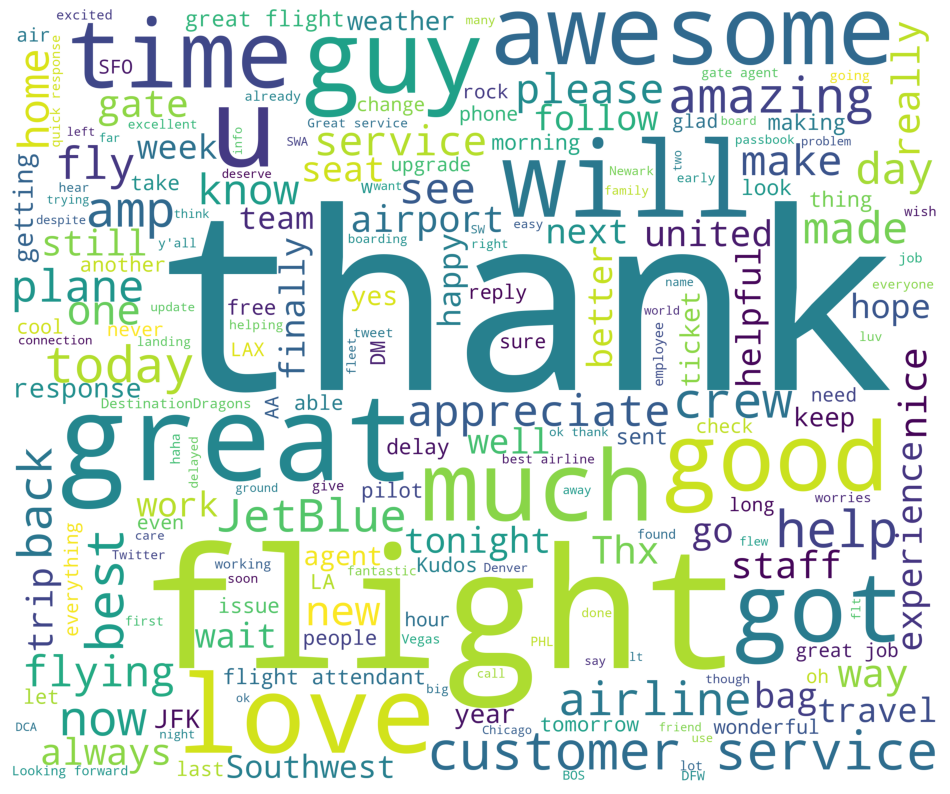

In [70]:
from wordcloud import WordCloud,STOPWORDS

new_df=text_df[text_df['airline_sentiment']=='positive']
words = ' '.join(new_df['text'])
cleaned_word = " ".join([word for word in words.split()
                            if 'http' not in word
                                and not word.startswith('@')
                                and word != 'RT'
                            ])
wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color='white',
                      width=3000,
                      height=2500
                     ).generate(cleaned_word)
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

**Negative Wordcloud**

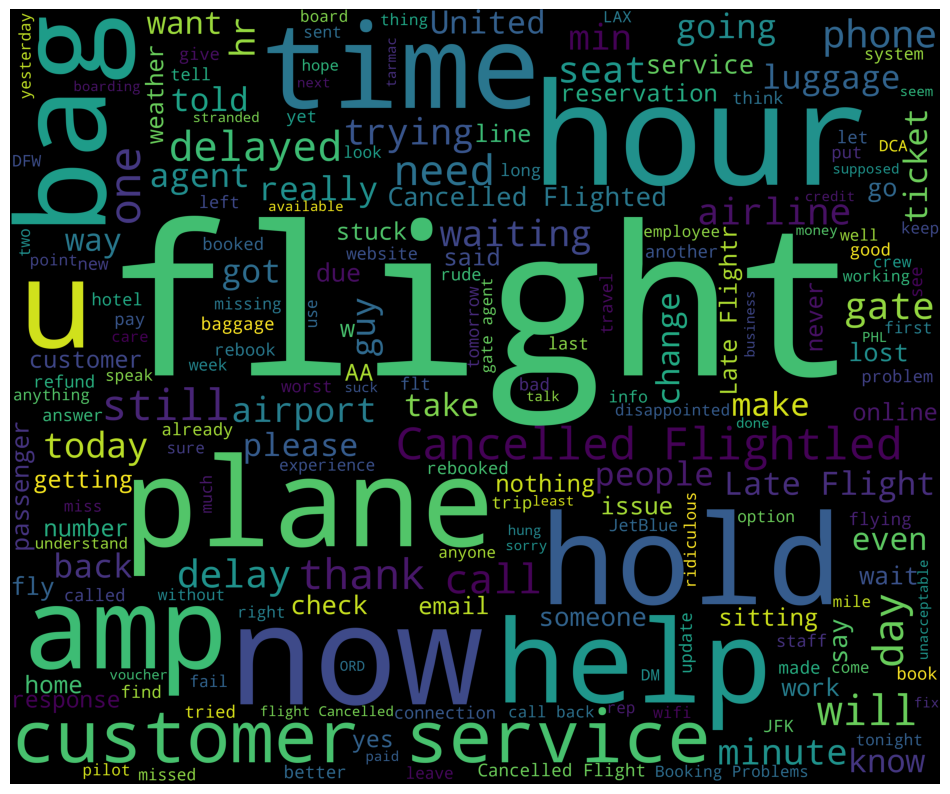

In [71]:
new_df=text_df[text_df['airline_sentiment']=='negative']
words = ' '.join(new_df['text'])
cleaned_word = " ".join([word for word in words.split()
                            if 'http' not in word
                                and not word.startswith('@')
                                and word != 'RT'
                            ])
wordcloud = WordCloud(stopwords=STOPWORDS,
                      background_color='black',
                      width=3000,
                      height=2500
                     ).generate(cleaned_word)
plt.figure(1,figsize=(12, 12))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

The features that will be used for the sentiment analysis will be "text" and "airline_sentiment"

In [72]:
text_df.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_location,user_timezone,hourly_count
0,567588278875213824,neutral,1.0,NaN,NaN,Delta,NaN,JetBlueNews,NaN,0,@JetBlue's new CEO seeks the right balance to ...,NaN,USA,Sydney,NaN
1,567590027375702016,negative,1.0,Can't Tell,0.6503,Delta,NaN,nesi_1992,NaN,0,@JetBlue is REALLY getting on my nerves !! 😡😡 ...,NaN,undecided,Pacific Time (US & Canada),NaN
2,567591480085463040,negative,1.0,Late Flight,0.3460,United,NaN,CPoutloud,NaN,0,@united yes. We waited in line for almost an h...,NaN,"Washington, DC",NaN,NaN
3,567592368451248130,negative,1.0,Late Flight,1.0000,United,NaN,brenduch,NaN,0,@united the we got into the gate at IAH on tim...,NaN,NaN,Buenos Aires,NaN
4,567594449874587648,negative,1.0,Customer Service Issue,0.3451,Southwest,NaN,VahidESQ,NaN,0,@SouthwestAir its cool that my bags take a bit...,NaN,"Los Angeles, CA",Pacific Time (US & Canada),NaN


### 3.2 Text Preprocessing - Sentiment Analysis

Importing the libraries that will be used to remove stop words, punctuation and words into its root (stemming).

In [73]:
import re
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem import PorterStemmer
from sklearn.feature_extraction.text import CountVectorizer
import sklearn.feature_extraction.text as sk_txt

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\leand\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [74]:
stop_words=stopwords.words('english')
stemmer=PorterStemmer()

In [75]:
stop_words

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

### 3.3 Feature Selection

In [76]:
X=text_df['text']
y=text_df['airline_sentiment']

In [77]:
X.shape

(14604,)

In [78]:
y.shape

(14604,)

In [79]:
# Instantiate an object cv by calling a method named as CountVectorzer()
cv = sk_txt.CountVectorizer(stop_words = 'english')

# Train the dataset by calling a fit_transform() method
X_fin = cv.fit_transform(X).toarray()

# Display the rows and colums
X_fin.shape

(14604, 14770)

### 3.4 Sentiment Analysis ML Models

In [80]:
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import f1_score

In [81]:
model1 = MultinomialNB()
model2 = DecisionTreeClassifier()
model3 = RandomForestClassifier()
model4 = KNeighborsClassifier()

In [82]:
# Split the dataset into training and testing parts
X_train, X_test, y_train, y_test = train_test_split(X_fin, y, test_size = 0.3, random_state=1)

In [83]:
# Train the model by calling a method fit() NB
model1.fit(X_train,y_train)

MultinomialNB()

In [84]:
# Train the model by calling a method fit() DecisionTree
model2.fit(X_train,y_train)

DecisionTreeClassifier()

In [85]:
# Train the model by calling a method fit() RandomForest
model3.fit(X_train,y_train)

RandomForestClassifier()

In [86]:
# Train the model by calling a method fit() KNeighbors
model4.fit(X_train,y_train)

KNeighborsClassifier()

In [87]:
# Call predict() method 
y_pred1 = model1.predict(X_test)

In [88]:
y_pred2 = model2.predict(X_test)

In [89]:
y_pred3 = model3.predict(X_test)

In [90]:
y_pred4 = model4.predict(X_test)

**Naive Bayes Metrics**

              precision    recall  f1-score   support

    negative       0.77      0.94      0.84      2734
     neutral       0.63      0.37      0.47       937
    positive       0.74      0.50      0.59       711

    accuracy                           0.75      4382
   macro avg       0.71      0.60      0.63      4382
weighted avg       0.73      0.75      0.72      4382



Text(50.722222222222214, 0.5, 'true')

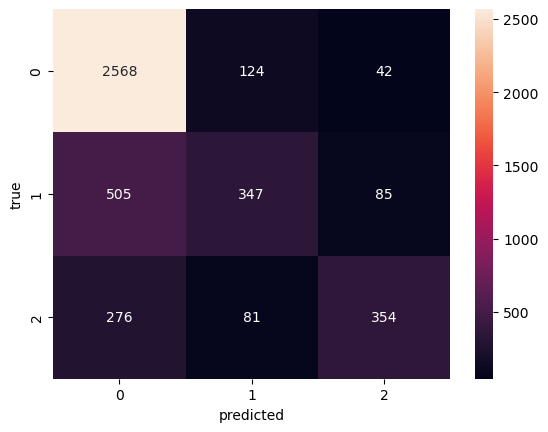

In [91]:
print(classification_report(y_test, y_pred1))

cm1 = confusion_matrix(y_test, y_pred1)

sns.heatmap(cm1, annot = True, fmt='g')
plt.xlabel("predicted")
plt.ylabel("true")

**Decision Tree Metrics**

              precision    recall  f1-score   support

    negative       0.78      0.77      0.78      2734
     neutral       0.42      0.47      0.44       937
    positive       0.54      0.48      0.51       711

    accuracy                           0.66      4382
   macro avg       0.58      0.57      0.58      4382
weighted avg       0.67      0.66      0.66      4382



Text(50.722222222222214, 0.5, 'true')

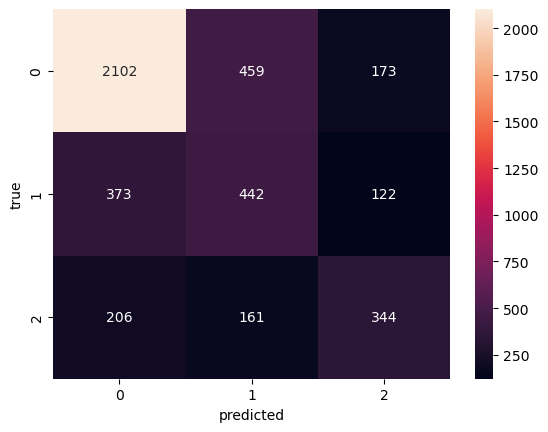

In [92]:
print(classification_report(y_test, y_pred2))

cm2 = confusion_matrix(y_test, y_pred2)

sns.heatmap(cm2, annot = True, fmt='g')
plt.xlabel("predicted")
plt.ylabel("true")

**Random Forest Metrics**

              precision    recall  f1-score   support

    negative       0.80      0.89      0.84      2734
     neutral       0.56      0.46      0.51       937
    positive       0.70      0.56      0.62       711

    accuracy                           0.75      4382
   macro avg       0.69      0.64      0.66      4382
weighted avg       0.73      0.75      0.74      4382



Text(50.722222222222214, 0.5, 'true')

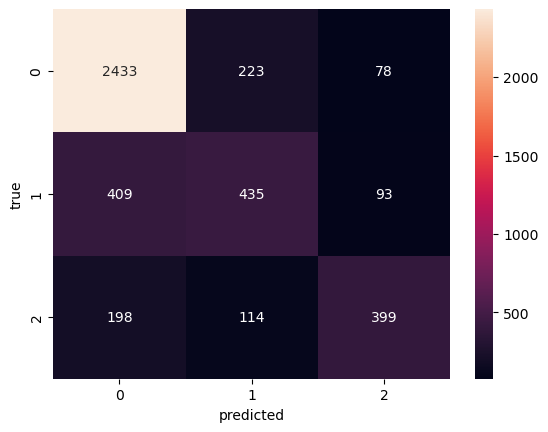

In [93]:
print(classification_report(y_test, y_pred3))

cm3 = confusion_matrix(y_test, y_pred3)

sns.heatmap(cm3, annot = True, fmt='g')
plt.xlabel("predicted")
plt.ylabel("true")

**K-Neighbors Metrics**

              precision    recall  f1-score   support

    negative       0.80      0.54      0.64      2734
     neutral       0.30      0.62      0.40       937
    positive       0.57      0.46      0.51       711

    accuracy                           0.54      4382
   macro avg       0.55      0.54      0.52      4382
weighted avg       0.65      0.54      0.57      4382



Text(50.722222222222214, 0.5, 'true')

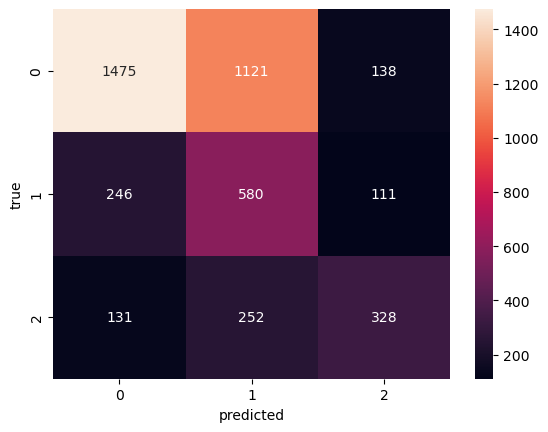

In [94]:
print(classification_report(y_test, y_pred4))

cm4 = confusion_matrix(y_test, y_pred4)

sns.heatmap(cm4, annot = True, fmt='g')
plt.xlabel("predicted")
plt.ylabel("true")

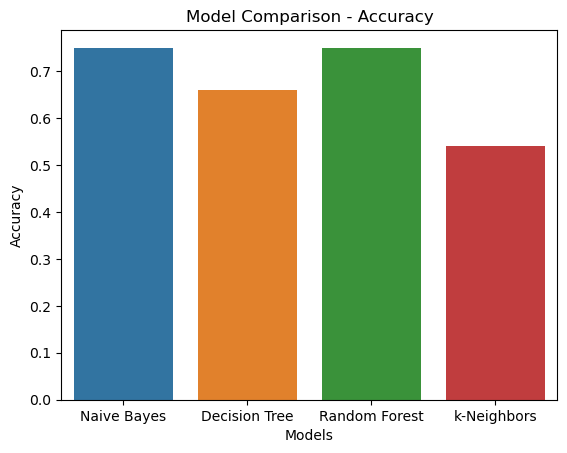

In [95]:
# Model names and accuracy scores
models = ['Naive Bayes', 'Decision Tree', 'Random Forest', 'k-Neighbors']
accuracy_scores = [0.75, 0.66, 0.75, 0.54]

# Plotting the chart
sns.barplot(x=models, y=accuracy_scores)
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Comparison - Accuracy')
plt.show()

By looking at the metrics the models that performed the best accruracy are Naive Bayes and Random Forest.

### 3.5 Text Preprocessing - Topic Modelling

**Import libraries**

In [96]:
import gensim
from gensim.utils import simple_preprocess
import gensim.corpora as corpora
import pyLDAvis.gensim
import pyLDAvis
pyLDAvis.enable_notebook()

# Print results nicely
from pprint import pprint

# If you want to save the visualisation data
import pickle 

In [97]:
# Helper function to turn our sentences into a list of words
# Yeild means that it returns a generator function ie it won't run all at once, but only as needed
def sent_to_words(sentences):
    for sentence in sentences:
        # deacc=True removes punctuations
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

In [98]:
# Helper function to remove stopwords
def remove_stopwords(texts, stopwords=stopwords):
    return [[word for word in simple_preprocess(str(doc)) if word not in stop_words] for doc in texts]

In [99]:
# Getting our texts in a list to process
texts = df['text'].values.tolist()

In [100]:
words = list(sent_to_words(texts))

In [101]:
words = remove_stopwords(words) 

In [102]:
len(words)

14640

In [103]:
# Make a dictionary of ids for the words
id2word = corpora.Dictionary(words)

adding document #0 to Dictionary<0 unique tokens: []>
adding document #10000 to Dictionary<10524 unique tokens: ['balance', 'ceo', 'co', 'daily', 'greenfield']...>
built Dictionary<13165 unique tokens: ['balance', 'ceo', 'co', 'daily', 'greenfield']...> from 14640 documents (total 145973 corpus positions)
Dictionary lifecycle event {'msg': "built Dictionary<13165 unique tokens: ['balance', 'ceo', 'co', 'daily', 'greenfield']...> from 14640 documents (total 145973 corpus positions)", 'datetime': '2023-05-28T16:38:07.934038', 'gensim': '4.3.1', 'python': '3.9.12 (main, Apr  4 2022, 05:22:27) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}


In [104]:
# Translates our words into their correspoinding ids
corpus = [id2word.doc2bow(text) for text in words]

In [105]:
corpus

[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1),
  (12, 1),
  (13, 1),
  (14, 1),
  (15, 1)],
 [(6, 1), (16, 1), (17, 1), (18, 1), (19, 1)],
 [(10, 1),
  (20, 1),
  (21, 1),
  (22, 1),
  (23, 1),
  (24, 1),
  (25, 1),
  (26, 1),
  (27, 1),
  (28, 1),
  (29, 1)],
 [(25, 1),
  (26, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1)],
 [(41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1)],
 [(13, 1),
  (25, 1),
  (32, 1),
  (40, 1),
  (56, 1),
  (57, 1),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 1),
  (62, 1)],
 [(25, 1), (63, 1), (64, 1), (65, 1), (66, 1), (67, 1), (68, 1), (69, 1)],
 [(25, 1),
  (54, 1),
  (70, 1),
  (71, 1),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (

### 3.6 LDA Results Visualization

6 is the number of Airlines mentioned in the Tweets

In [106]:
# Based on 'expert knowledge'
num_topics = 6

In [107]:
# Making our LDA model object
lda_model = gensim.models.LdaMulticore(
        corpus=corpus,
        id2word=id2word,
        num_topics=num_topics
)

using symmetric alpha at 0.16666666666666666
using symmetric eta at 0.16666666666666666
using serial LDA version on this node
running online LDA training, 6 topics, 1 passes over the supplied corpus of 14640 documents, updating every 14000 documents, evaluating every ~14640 documents, iterating 50x with a convergence threshold of 0.001000
too few updates, training might not converge; consider increasing the number of passes or iterations to improve accuracy
training LDA model using 7 processes
PROGRESS: pass 0, dispatched chunk #0 = documents up to #2000/14640, outstanding queue size 1
PROGRESS: pass 0, dispatched chunk #1 = documents up to #4000/14640, outstanding queue size 2
PROGRESS: pass 0, dispatched chunk #2 = documents up to #6000/14640, outstanding queue size 3
PROGRESS: pass 0, dispatched chunk #3 = documents up to #8000/14640, outstanding queue size 4
PROGRESS: pass 0, dispatched chunk #4 = documents up to #10000/14640, outstanding queue size 5
PROGRESS: pass 0, dispatched c

In [108]:
pprint(lda_model.print_topics())

topic #0 (0.167): 0.031*"flight" + 0.026*"southwestair" + 0.022*"jetblue" + 0.021*"americanair" + 0.012*"usairways" + 0.011*"united" + 0.007*"virginamerica" + 0.007*"thanks" + 0.006*"help" + 0.006*"us"
topic #1 (0.167): 0.046*"americanair" + 0.027*"united" + 0.025*"flight" + 0.017*"usairways" + 0.012*"thanks" + 0.010*"get" + 0.008*"co" + 0.008*"http" + 0.008*"cancelled" + 0.008*"jetblue"
topic #2 (0.167): 0.037*"united" + 0.024*"co" + 0.023*"http" + 0.018*"southwestair" + 0.016*"jetblue" + 0.009*"flight" + 0.009*"americanair" + 0.007*"usairways" + 0.006*"please" + 0.006*"cancelled"
topic #3 (0.167): 0.027*"united" + 0.019*"americanair" + 0.018*"jetblue" + 0.014*"flight" + 0.014*"southwestair" + 0.008*"make" + 0.007*"usairways" + 0.006*"http" + 0.006*"co" + 0.006*"delayed"
topic #4 (0.167): 0.039*"flight" + 0.026*"southwestair" + 0.022*"americanair" + 0.019*"jetblue" + 0.015*"usairways" + 0.013*"united" + 0.013*"get" + 0.009*"cancelled" + 0.008*"thanks" + 0.007*"help"
topic #5 (0.167): 

[(0,
  '0.031*"flight" + 0.026*"southwestair" + 0.022*"jetblue" + '
  '0.021*"americanair" + 0.012*"usairways" + 0.011*"united" + '
  '0.007*"virginamerica" + 0.007*"thanks" + 0.006*"help" + 0.006*"us"'),
 (1,
  '0.046*"americanair" + 0.027*"united" + 0.025*"flight" + 0.017*"usairways" + '
  '0.012*"thanks" + 0.010*"get" + 0.008*"co" + 0.008*"http" + '
  '0.008*"cancelled" + 0.008*"jetblue"'),
 (2,
  '0.037*"united" + 0.024*"co" + 0.023*"http" + 0.018*"southwestair" + '
  '0.016*"jetblue" + 0.009*"flight" + 0.009*"americanair" + 0.007*"usairways" '
  '+ 0.006*"please" + 0.006*"cancelled"'),
 (3,
  '0.027*"united" + 0.019*"americanair" + 0.018*"jetblue" + 0.014*"flight" + '
  '0.014*"southwestair" + 0.008*"make" + 0.007*"usairways" + 0.006*"http" + '
  '0.006*"co" + 0.006*"delayed"'),
 (4,
  '0.039*"flight" + 0.026*"southwestair" + 0.022*"americanair" + '
  '0.019*"jetblue" + 0.015*"usairways" + 0.013*"united" + 0.013*"get" + '
  '0.009*"cancelled" + 0.008*"thanks" + 0.007*"help"'),
 (5

In [109]:
# Preparing our results for visualisation
LDAvis_prepared = pyLDAvis.gensim.prepare(
    lda_model, 
    corpus, 
    id2word
)

In [110]:
LDAvis_prepared

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
5     -0.039939  0.018363       1        1  24.536866
1     -0.033681  0.018914       2        1  21.253953
4     -0.036478  0.004291       3        1  19.273888
0     -0.026888 -0.010409       4        1  15.972335
2      0.092316  0.055390       5        1  10.467871
3      0.044670 -0.086550       6        1   8.495086, topic_info=             Term         Freq        Total Category  logprob  loglift
25         united  3224.000000  3224.000000  Default  30.0000  30.0000
52   southwestair  2235.000000  2235.000000  Default  29.0000  29.0000
2              co  1017.000000  1017.000000  Default  28.0000  28.0000
5            http   973.000000   973.000000  Default  27.0000  27.0000
6         jetblue  1902.000000  1902.000000  Default  26.0000  26.0000
..            ...          ...          ...      ...      ...      ...
127     usairways    81.863336  2643.964469   Topic6  -5.0204  -1.0093
35            got    45.093997   526.811486   Topic6  -5.6167   0.0076
126            us    46.028424   632.694980   Topic6  -5.5962  -0.1550
75        flights    43.952781   523.435294   Topic6  -5.6424  -0.0116
40           time    45.517327   727.431109   Topic6  -5.6074  -0.3057

[512 rows x 6 columns], token_table=       Topic      Freq  Term
term                        
1010       1  0.211265    aa
1010       2  0.467993    aa
1010       3  0.042788    aa
1010       4  0.229985    aa
1010       5  0.034765    aa
...      ...       ...   ...
13156      2  0.947491   zik
2997       1  0.879688  zone
2997       2  0.035188  zone
2997       3  0.035188  zone
2997       4  0.035188  zone

[1251 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[6, 2, 5, 1, 3, 4])

### 3.7 Optimizing LDA Model

In [111]:
# Adding more stop words based on 'expert knowledge' and some data exploration
stop_words.extend(['http', 'get', 'us', 'co', 'amp', 'dm', 'aa', 'got'])

In [112]:
# Remove punctuation
df['processsed_text'] = df['text'].map(lambda x: re.sub('[,\\.!?]', '', x))
# Convert the titles to lowercase
df['processsed_text'] = df['processsed_text'].map(lambda x: x.lower())

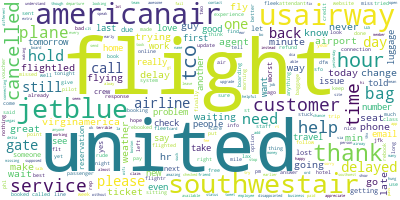

In [113]:
texts = df['processsed_text'].values.tolist()
words = list(sent_to_words(texts))
words = remove_stopwords(words) 

# Processing for the word cloud (remember it needs one long string)
long_list = []
for text in words:
    long_list.extend(text)
long_list

long_string = ','.join(long_list)
# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue', collocations=False)
# Generate a word cloud
wordcloud.generate(long_string)
# Visualize the word cloud
wordcloud.to_image()

**After exploration reduce the number of topics to 4**

In [114]:
id2word = corpora.Dictionary(words)
corpus = [id2word.doc2bow(text) for text in words]
num_topics = 4
lda_model = gensim.models.LdaMulticore(
        corpus=corpus,
        id2word=id2word,
        num_topics=num_topics
)
LDAvis_prepared = pyLDAvis.gensim.prepare(
    lda_model, 
    corpus, 
    id2word
)

LDAvis_prepared

adding document #0 to Dictionary<0 unique tokens: []>
adding document #10000 to Dictionary<10867 unique tokens: ['balance', 'ceo', 'daily', 'greenfield', 'jetblue']...>
built Dictionary<13693 unique tokens: ['balance', 'ceo', 'daily', 'greenfield', 'jetblue']...> from 14640 documents (total 140777 corpus positions)
Dictionary lifecycle event {'msg': "built Dictionary<13693 unique tokens: ['balance', 'ceo', 'daily', 'greenfield', 'jetblue']...> from 14640 documents (total 140777 corpus positions)", 'datetime': '2023-05-28T16:42:39.060874', 'gensim': '4.3.1', 'python': '3.9.12 (main, Apr  4 2022, 05:22:27) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
using symmetric alpha at 0.25
using symmetric eta at 0.25
using serial LDA version on this node
running online LDA training, 4 topics, 1 passes over the supplied corpus of 14640 documents, updating every 14000 documents, evaluating every ~14640 documents, iterating 50x with a convergence threshol

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
1     -0.013356  0.005239       1        1  35.787189
2     -0.050138  0.041851       2        1  25.892196
3     -0.013114 -0.064373       3        1  24.062878
0      0.076608  0.017284       4        1  14.257737, topic_info=             Term         Freq        Total Category  logprob  loglift
4         jetblue  1856.000000  1856.000000  Default  30.0000  30.0000
24         united  3253.000000  3253.000000  Default  29.0000  29.0000
50   southwestair  2148.000000  2148.000000  Default  28.0000  28.0000
201     cancelled  1010.000000  1010.000000  Default  27.0000  27.0000
381      flighted   255.000000   255.000000  Default  26.0000  26.0000
..            ...          ...          ...      ...      ...      ...
50   southwestair   139.671803  2148.076116   Topic4  -4.9678  -0.7852
65            one    75.914315   489.365757   Topic4  -5.5775   0.0844
96            bag    70.314199   453.640139   Topic4  -5.6541   0.0835
257          late    61.928303   387.324231   Topic4  -5.7811   0.1146
152       airport    61.639648   391.329708   Topic4  -5.7858   0.0996

[358 rows x 6 columns], token_table=       Topic      Freq      Term
term                            
13604      3  0.952341      aadv
3078       1  0.972950  accident
8157       1  0.930827   advised
13586      4  0.858529  aeroport
624        1  0.362547     agent
...      ...       ...       ...
13623      1  0.942915     yesso
466        1  0.921791      york
466        3  0.043895      york
466        4  0.043895      york
13680      3  0.953006    ywxrfn

[693 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 3, 4, 1])

In [115]:
# Adding our predicted topic (based on highest affinity score) and the corresponding score to the dataframe
predicted_topics = []
predicted_scores = []

for word in words:
    # Gets the predicted topics for a given document
    pred_topics = lda_model.get_document_topics(id2word.doc2bow(word), minimum_probability=None)
    # Sort the predicted topics by max score
    pred_topics.sort(reverse=True, key=lambda x: x[1])
    # Add the topic and socre to their respective lists
    predicted_topics.append(pred_topics[0][0])
    predicted_scores.append(pred_topics[0][1])
df['predicted_topic'] = predicted_topics
df['predicted_score'] = predicted_scores

In [116]:
df.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_location,user_timezone,hourly_count,processsed_text,predicted_topic,predicted_score
tweet_created,,,,,,,,,,,,,,,,,,
2015-02-16 23:36:05-08:00,567588278875213824,neutral,1.0,NaN,NaN,Delta,NaN,JetBlueNews,NaN,0,@JetBlue's new CEO seeks the right balance to ...,NaN,USA,Sydney,NaN,@jetblue's new ceo seeks the right balance to ...,1,0.950148
2015-02-16 23:43:02-08:00,567590027375702016,negative,1.0,Can't Tell,0.6503,Delta,NaN,nesi_1992,NaN,0,@JetBlue is REALLY getting on my nerves !! 😡😡 ...,NaN,undecided,Pacific Time (US & Canada),NaN,@jetblue is really getting on my nerves 😡😡 #n...,1,0.866429
2015-02-16 23:48:48-08:00,567591480085463040,negative,1.0,Late Flight,0.3460,United,NaN,CPoutloud,NaN,0,@united yes. We waited in line for almost an h...,NaN,"Washington, DC",NaN,NaN,@united yes we waited in line for almost an ho...,1,0.933270
2015-02-16 23:52:20-08:00,567592368451248130,negative,1.0,Late Flight,1.0000,United,NaN,brenduch,NaN,0,@united the we got into the gate at IAH on tim...,NaN,NaN,Buenos Aires,NaN,@united the we got into the gate at iah on tim...,1,0.768395
2015-02-17 00:00:36-08:00,567594449874587648,negative,1.0,Customer Service Issue,0.3451,Southwest,NaN,VahidESQ,NaN,0,@SouthwestAir its cool that my bags take a bit...,NaN,"Los Angeles, CA",Pacific Time (US & Canada),NaN,@southwestair its cool that my bags take a bit...,3,0.950006


### 3.8 Results, Conclusions and Limitations

Four different machine learning models were employed for sentiment analysis and two of them (Naive Bayes and Random Forest) performed relatively well with good accuracy, however with room for improvements. As a next step I will look further into preprocessing the text by removing more of the stop words and punctuations and even employ LDA (Latent Dirichlet Allocation) before passing the data through the machine learning models for sentiment analysis to improve accuracy.

LDA (Latent Dirichlet Allocation) was employed and able to distinguish 4 different topics across the tweets, (which can be visulized in the Intertopic Distance Map). However the data is very limited on this end as there are no much variation across the topics which basically approaches the customers opinions about flights and airline companies, making it more difficult to distinguish across different topics.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      4. Part 3: Combine both models (Time-Series and Text Analysis)
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

### 4.1 Exploration

In [117]:
df.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_location,user_timezone,hourly_count,processsed_text,predicted_topic,predicted_score
tweet_created,,,,,,,,,,,,,,,,,,
2015-02-16 23:36:05-08:00,567588278875213824,neutral,1.0,NaN,NaN,Delta,NaN,JetBlueNews,NaN,0,@JetBlue's new CEO seeks the right balance to ...,NaN,USA,Sydney,NaN,@jetblue's new ceo seeks the right balance to ...,1,0.950148
2015-02-16 23:43:02-08:00,567590027375702016,negative,1.0,Can't Tell,0.6503,Delta,NaN,nesi_1992,NaN,0,@JetBlue is REALLY getting on my nerves !! 😡😡 ...,NaN,undecided,Pacific Time (US & Canada),NaN,@jetblue is really getting on my nerves 😡😡 #n...,1,0.866429
2015-02-16 23:48:48-08:00,567591480085463040,negative,1.0,Late Flight,0.3460,United,NaN,CPoutloud,NaN,0,@united yes. We waited in line for almost an h...,NaN,"Washington, DC",NaN,NaN,@united yes we waited in line for almost an ho...,1,0.933270
2015-02-16 23:52:20-08:00,567592368451248130,negative,1.0,Late Flight,1.0000,United,NaN,brenduch,NaN,0,@united the we got into the gate at IAH on tim...,NaN,NaN,Buenos Aires,NaN,@united the we got into the gate at iah on tim...,1,0.768395
2015-02-17 00:00:36-08:00,567594449874587648,negative,1.0,Customer Service Issue,0.3451,Southwest,NaN,VahidESQ,NaN,0,@SouthwestAir its cool that my bags take a bit...,NaN,"Los Angeles, CA",Pacific Time (US & Canada),NaN,@southwestair its cool that my bags take a bit...,3,0.950006


**Firstly I will visualize each sentiment category separetely over time.**

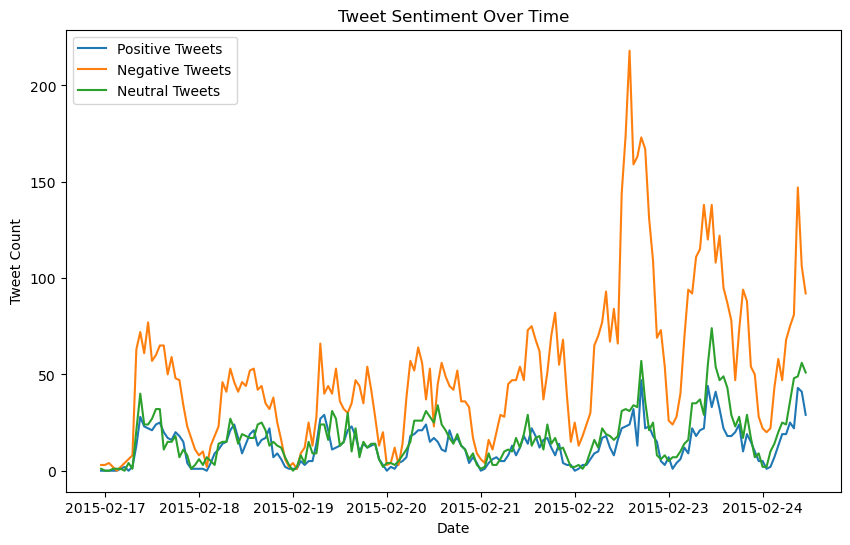

In [118]:
hourly_counts = df['airline_sentiment'].groupby(pd.Grouper(freq='H')).value_counts().unstack().fillna(0)

plt.figure(figsize=(10, 6))
plt.plot(hourly_counts.index, hourly_counts['positive'], label='Positive Tweets')
plt.plot(hourly_counts.index, hourly_counts['negative'], label='Negative Tweets')
plt.plot(hourly_counts.index, hourly_counts['neutral'], label='Neutral Tweets')

plt.xlabel('Date')
plt.ylabel('Tweet Count')
plt.title('Tweet Sentiment Over Time')
plt.legend(loc='upper left')
plt.show()

**Visualize only positive tweets over time.**

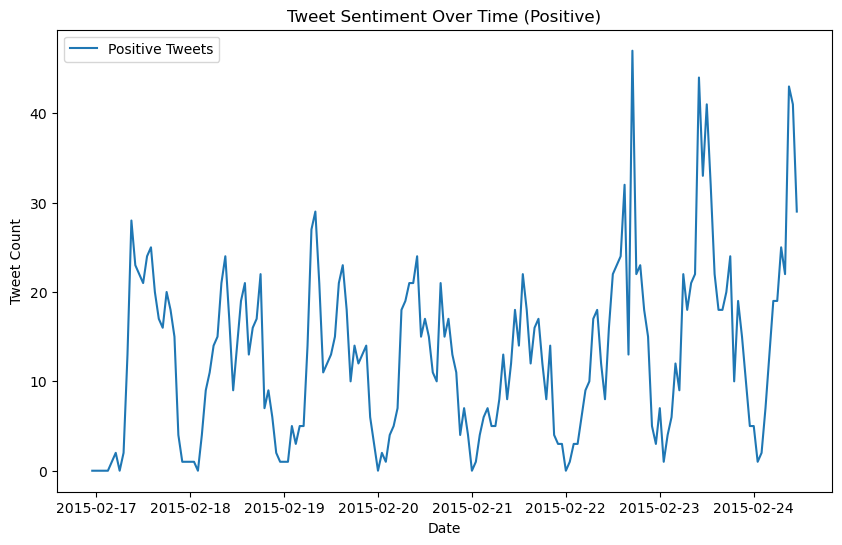

In [119]:
plt.figure(figsize=(10, 6))
plt.plot(hourly_counts.index, hourly_counts['positive'], label='Positive Tweets')

plt.xlabel('Date')
plt.ylabel('Tweet Count')
plt.title('Tweet Sentiment Over Time (Positive)')
plt.legend(loc='upper left')
plt.show()

**I will also visualize the different topics over time.**

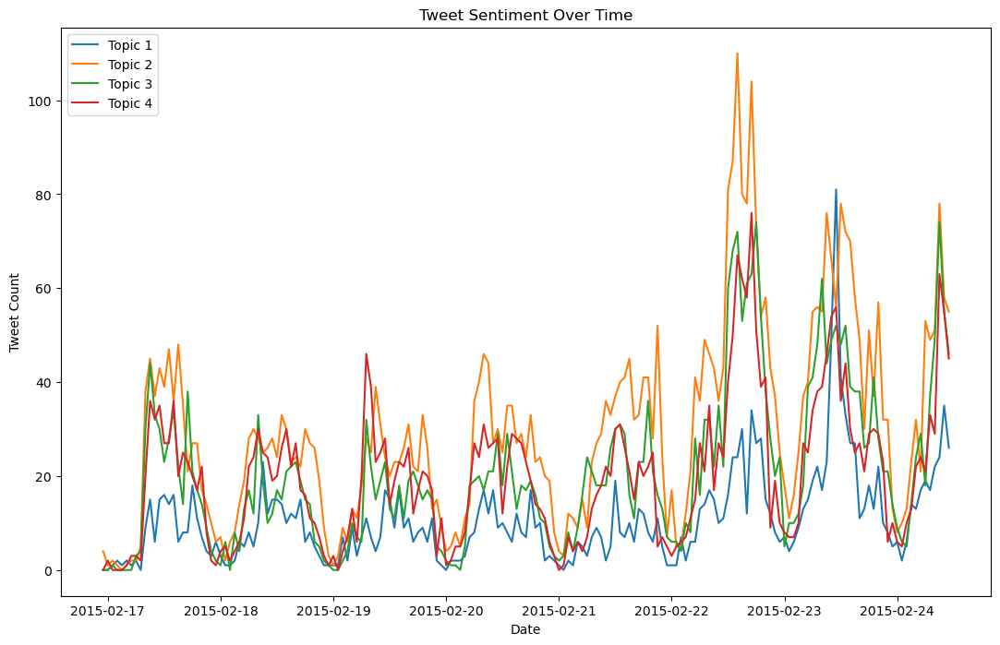

In [120]:
hourly_topics = df['predicted_topic'].groupby(pd.Grouper(freq='H')).value_counts().unstack().fillna(0)

plt.figure(figsize=(13, 8))
plt.plot(hourly_topics.index, hourly_topics[0], label='Topic 1')
plt.plot(hourly_topics.index, hourly_topics[1], label='Topic 2')
plt.plot(hourly_topics.index, hourly_topics[2], label='Topic 3')
plt.plot(hourly_topics.index, hourly_topics[3], label='Topic 4')

plt.xlabel('Date')
plt.ylabel('Tweet Count')
plt.title('Tweet Sentiment Over Time')
plt.legend(loc='upper left')
plt.show()

**I will select Topic 2 for prediction**

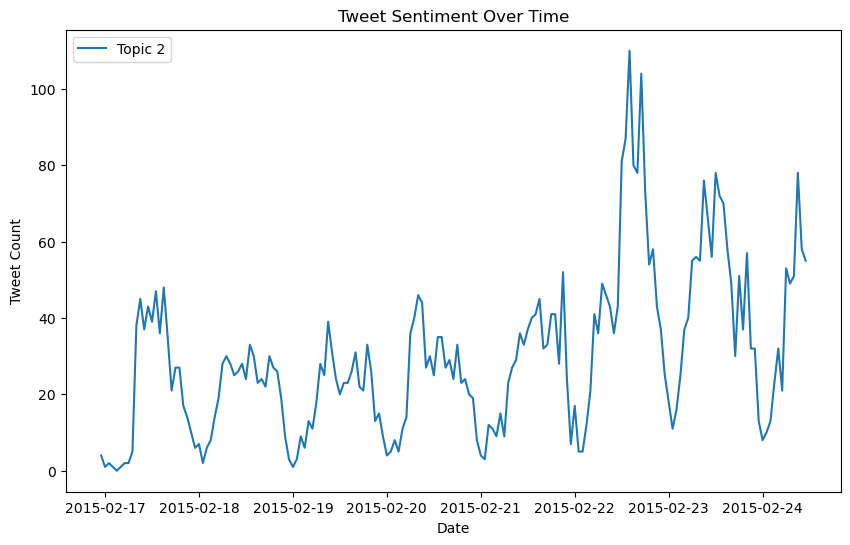

In [495]:
plt.figure(figsize=(10, 6))
plt.plot(hourly_topics.index, hourly_topics[1], label='Topic 2')

plt.xlabel('Date')
plt.ylabel('Tweet Count')
plt.title('Tweet Sentiment Over Time')
plt.legend(loc='upper left')
plt.show()

### 4.2 Positive tweets prediction into the future - ARIMA Model

Start by decomposing the variable into trend, seasonal and residual.

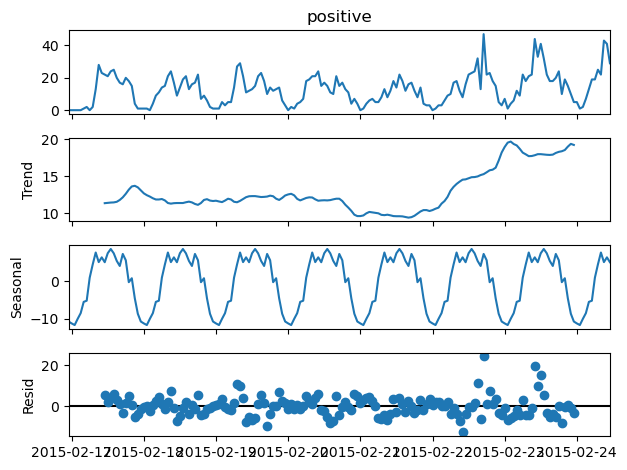

In [122]:
# Fill any missing values with zero
hourly_counts['positive'].fillna(0, inplace=True)

# Perform seasonal decomposition using period = 24 hours
result = seasonal_decompose(hourly_counts['positive'], model='additive', period=24)

# Plot the decomposition results
result.plot()
plt.show()

**Hyperparameters search**

In [123]:
aicVals = []
for p in range(0, 6):
    for d in range(0, 6):
         for q in range(0, 6):
                aicVals.append([sm.ARIMA(hourly_counts['positive'], order=(p, d, q)).fit().aic, p, d, q])

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

In [124]:
aicVals.sort()

In [125]:
aicVals

[[16.0, 2, 5, 5],
 [1143.1081164807595, 5, 1, 2],
 [1143.418416082045, 3, 1, 4],
 [1143.935653874531, 3, 1, 5],
 [1148.868564918284, 3, 1, 2],
 [1150.137834900317, 5, 1, 4],
 [1150.40779444692, 3, 0, 4],
 [1150.7238055108432, 5, 0, 4],
 [1151.4520995946627, 4, 0, 4],
 [1153.4243443177534, 4, 0, 5],
 [1153.790761911624, 2, 0, 5],
 [1153.9345450795622, 3, 0, 2],
 [1157.2046933296533, 2, 0, 4],
 [1158.872303029469, 3, 0, 5],
 [1160.840456314708, 4, 0, 3],
 [1163.0512906002846, 5, 1, 5],
 [1164.9224574225284, 2, 0, 2],
 [1165.793853574978, 5, 0, 5],
 [1165.9848785872023, 5, 1, 3],
 [1166.28605374188, 3, 0, 1],
 [1166.6683777226442, 2, 0, 3],
 [1166.85630754549, 5, 0, 1],
 [1168.1712205511471, 4, 0, 1],
 [1168.2216602321855, 4, 1, 5],
 [1168.780989662705, 3, 0, 3],
 [1168.8934705215106, 5, 0, 3],
 [1169.8965816255425, 4, 0, 2],
 [1171.8502483000927, 5, 0, 2],
 [1171.8837662315161, 2, 1, 2],
 [1172.504091489092, 5, 0, 0],
 [1173.5712852225492, 1, 1, 5],
 [1173.7411866124376, 2, 1, 3],
 [1174

In [126]:
len(hourly_counts['positive'])

181

**Train / Test split --> 80% / 20%**

In [127]:
train = hourly_counts['positive'][:145]
test = hourly_counts['positive'][145:]

**Based on trial and error testing the lowest AIC parameters, the best hyperparameters found are:**

    - p = 3  
    - d = 0  
    - q = 4  

In [128]:
positive_model = ARIMA(train, order=(3,0,4)).fit()

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [129]:
positive_pred = positive_model.predict(start=len(train), end=len(hourly_counts['positive'])-1)

<AxesSubplot:xlabel='tweet_created'>

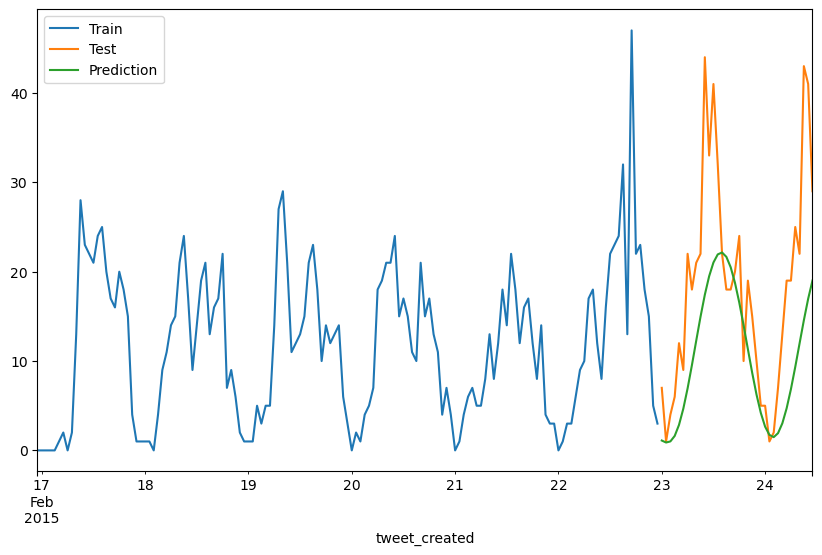

In [130]:
train.plot(legend=True, label='Train', figsize=(10,6))
test.plot(legend=True, label='Test')
positive_pred.plot(legend=True, label='Prediction')

**Predicting 3 days into the future**

In [131]:
pred_3days = positive_model.predict(len(hourly_counts['positive']),len(hourly_counts['positive'])+72)

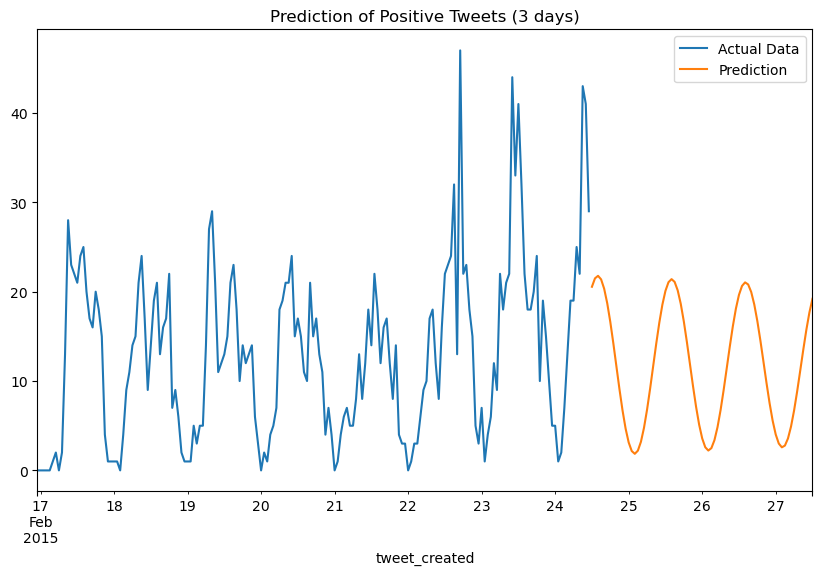

In [132]:
hourly_counts['positive'].plot(legend=True, label='Actual Data', figsize=(10,6))
pred_3days.plot(legend=True, label='Prediction')
plt.title('Prediction of Positive Tweets (3 days)');

### 4.3 Topic 2 prediction into the future - ARIMA Model

Decompose topic 2

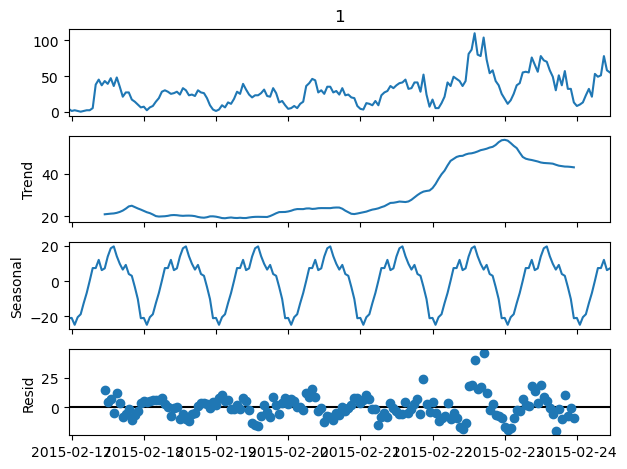

In [496]:
# Fill any missing values with zero
hourly_topics[1].fillna(0, inplace=True)

# Perform seasonal decomposition using period = 24 hours
result = seasonal_decompose(hourly_topics[1], model='additive', period=24)

# Plot the decomposition results
result.plot()
plt.show()

**Hyperparameters search**

In [497]:
aicVals = []
for p in range(0, 7):
    for d in range(0, 7):
         for q in range(0, 7):
                aicVals.append([sm.ARIMA(hourly_topics[1], order=(p, d, q)).fit().aic, p, d, q])

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximu

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [498]:
aicVals.sort()

In [499]:
aicVals

[[1341.3719127063885, 4, 1, 2],
 [1341.719931000111, 4, 1, 3],
 [1342.04900650651, 5, 1, 4],
 [1343.481795435292, 4, 1, 5],
 [1344.6885002530853, 5, 1, 3],
 [1345.1511109230419, 4, 1, 4],
 [1346.401762733668, 4, 1, 6],
 [1346.7134077945193, 6, 1, 6],
 [1348.2584975233572, 5, 1, 5],
 [1351.2325736286325, 6, 1, 5],
 [1351.395548729441, 5, 1, 6],
 [1354.2656411403268, 5, 0, 6],
 [1354.4253136760447, 6, 0, 6],
 [1354.6475137988352, 5, 0, 5],
 [1354.780316006591, 6, 0, 5],
 [1355.8584610192024, 4, 1, 1],
 [1357.4467053721296, 6, 1, 4],
 [1357.6232570116183, 5, 1, 1],
 [1358.4928871133607, 6, 1, 1],
 [1359.3119674656555, 5, 1, 2],
 [1359.914081162012, 1, 1, 4],
 [1361.2838481986414, 6, 1, 2],
 [1361.5574937764159, 1, 1, 5],
 [1361.8557973441202, 6, 1, 3],
 [1362.8203358264723, 1, 1, 6],
 [1363.0187267968197, 3, 0, 5],
 [1363.1118091604164, 3, 1, 5],
 [1363.3989193067882, 3, 1, 4],
 [1363.4054347462052, 2, 1, 5],
 [1363.9943613929204, 3, 1, 6],
 [1364.302524036574, 4, 0, 0],
 [1364.3834444883

In [500]:
len(hourly_topics[1])

181

**Train / Test split --> 90% / 10%**

This train was increased to 90% as the model was failing to predict the peak the occurs in the last days of the sample and including more data in the train model improved performance.

In [505]:
topic_train = hourly_topics[1][:163]
topic_test = hourly_topics[1][163:]

**After trying different parameters the ones performing best are:**

    - p = 6    
    - d = 0  
    - q = 5  

In [528]:
topic_model = ARIMA(topic_train, order=(6,0,5)).fit()

C:\Users\leand\anaconda3\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [529]:
topic_pred = topic_model.predict(start=len(topic_train), end=len(hourly_topics[1])-1)

<AxesSubplot:xlabel='tweet_created'>

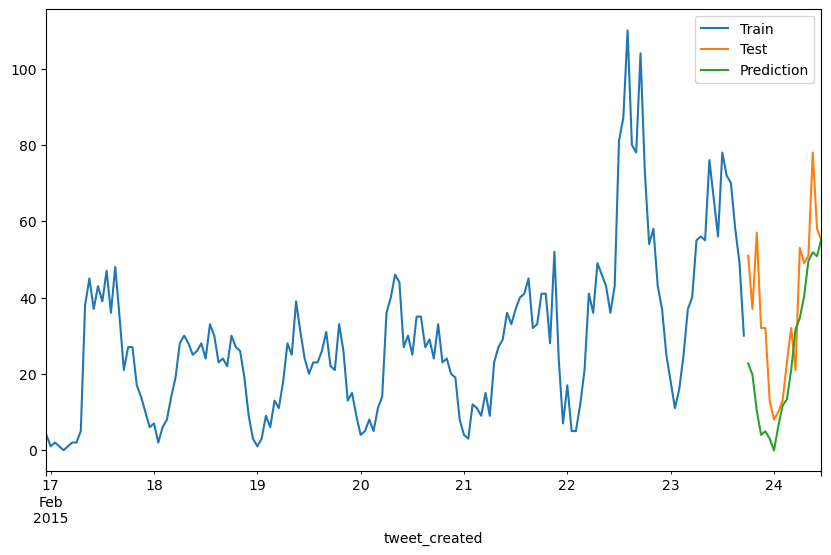

In [530]:
topic_train.plot(legend=True, label='Train', figsize=(10,6))
topic_test.plot(legend=True, label='Test')
topic_pred.plot(legend=True, label='Prediction')

It's observed the model is performing well.

In [531]:
topic_pred_3days = topic_model.predict(len(hourly_topics[1]),len(hourly_topics[1])+72)

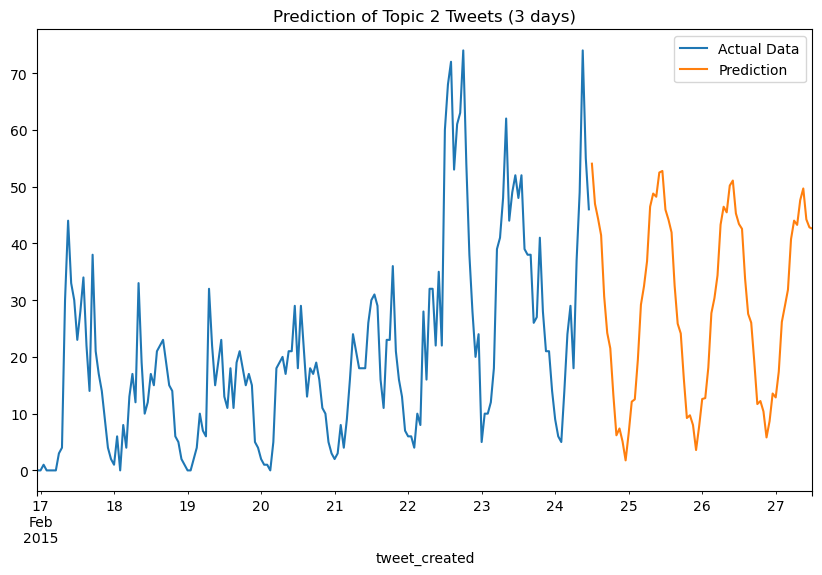

In [533]:
hourly_topics[2].plot(legend=True, label='Actual Data', figsize=(10,6))
topic_pred_3days.plot(legend=True, label='Prediction')
plt.title('Prediction of Topic 2 Tweets (3 days)');

<font color=red>**Note:** <font color=black> After re-running the notebook the LDA results (Topic modelling) changed and therefore the results for predicting the topic using ARIMA also changed. The above results for topic prediction won't be the same as the results reflecting in the business report and the topic used in the business report was Topic 1 vs Topic 2 in this notebook. This is something I will keep on the radar and try to set parameters for the Topic Modelling to get same results when the notebook is re-ran.

### 4.4 Results, Conclusions and Limitations

The machine learning algorithm ARIMA was employed to predict the number of positive tweets and also the number of tweets contained in the Topic 1 defined during the Topic Modelling stage.

For the positive tweet prediction, the model failed to predict the spike in the number of tweets that happens by the end of the week, however, with the limitation of the data, the spike cannot be confirmed as a trend or seasonality and therefore we can say the model is performing considerably well within the available capacity / information.  

For topic prediction a more robust model was employed searching for a larger range of hyperparameters and increasing the train split to 90% which showed improvements on the model’s prediction.  

Again, in order to improve the models, it is recommended that future tweets are tracked and recorded in a data set with at least a month or quarter of tweets so the models can rely on more data to learn and make better predictions, which will ultimately help the business make better and informed decisions.

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

<H3 style="color:blue;font-family:Arial, monospace; text-align:center">
      5. Bibliography
    <H3>

<hr style="height:2px; width:90%; border-width:0; color:red; background-color:blue; align:center">

### Reference list  


**Auhl, M. (2021).** What is an ARIMA Model? [online] Medium. Available at: https://towardsdatascience.com/what-is-an-arima-model-9e200f06f9eb.  

**Brownlee, J. (2018).** How to Grid Search SARIMA Hyperparameters for Time Series Forecasting. [online] Machine Learning Mastery. Available at: https://machinelearningmastery.com/how-to-grid-search-sarima-model-hyperparameters-for-time-series-forecasting-in-python/.  

**Nachiketa Hebbar (2020).** Twitter Sentiment Analysis Using Python for Complete Beginners. [online] Medium. Available at: https://medium.com/swlh/tweet-sentiment-analysis-using-python-for-complete-beginners-4aeb4456040.  

**Verma , Y. (2021).** Why Decompose a Time Series, and How? [online] Analytics India Magazine. Available at: https://analyticsindiamag.com/why-decompose-a-time-series-and-how/ [Accessed 14 May 2023].  

**Verma, Y. (2021).** Complete Guide To Dickey-Fuller Test In Time-Series Analysis. [online] Analytics India Magazine. Available at: https://analyticsindiamag.com/complete-guide-to-dickey-fuller-test-in-time-series-analysis/.